In [2]:
import sys
sys.path.append('./simulator_exhaustion/')
from simulator import *


from tqdm.auto import tqdm
from tqdm_joblib import tqdm_joblib

import numpy as np
import pandas as pd
import json
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns

from collections import defaultdict
from joblib import Parallel, delayed


import os


plt.rcParams.update({
    "mathtext.fontset": "stix",
    "font.family": "STIXGeneral",
    "legend.fontsize": 14,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "axes.titlesize": 16,
    "axes.labelsize": 18,
})
mpl.rcParams['animation.embed_limit'] = 2000  

In [6]:
omega0_values = np.round(np.linspace(0.5, 1.0, 11), 2)
delta_values  = np.round(np.linspace(0.25, 1.0, 11), 2)
print(omega0_values)
print(delta_values)

print("\n", np.round(np.linspace(250, 500, 4), 0))

[0.5  0.55 0.6  0.65 0.7  0.75 0.8  0.85 0.9  0.95 1.  ]
[0.25 0.32 0.4  0.48 0.55 0.62 0.7  0.78 0.85 0.92 1.  ]

 [250. 333. 417. 500.]


In [ ]:
# omega0_values = np.round(np.linspace(0.5, 1.0, 51), 2)
# delta_values  = np.round(np.linspace(0.25, 1.0, 51), 2)

# chi0 = 0.0
# phi = 0.1
# rho_min = 0.0
# rho_max = 0.25
# replicates = 25
# T_total = 10.0 

# def run_one(omega0, delta, replicate):
#     # If you want reproducibility per replicate, consider seeding here, e.g.:
#     # np.random.seed( (hash((omega0, delta, replicate)) % (2**32 - 1)) )
#     val = KTSimulator(
#         SIM_DURATION=T_total,
#         KILLER_STATE_INIT=float(omega0),
#         TARGET_STATE_INIT=float(delta),
#         DEATH_FAC_INIT=float(chi0),
#         RECOVERY_SPEED=float(phi),
#         MIN_STATE_DECAY_dt=float(rho_min),
#         MAX_STATE_DECAY_dt=float(rho_max),
#     )[0]
#     return (float(omega0), float(delta), int(replicate), val)

# # Build the job list (cartesian product)
# jobs = list(product(omega0_values, delta_values, range(replicates)))

# # Use all but one CPU by default
# n_jobs = max(os.cpu_count() - 1, 1)

# # Run in parallel with a progress bar
# with tqdm_joblib(tqdm(total=len(jobs), desc="Running KTSimulator in parallel")):
#     results = Parallel(n_jobs=n_jobs, backend="loky")(delayed(run_one)(*args) for args in jobs)

# # Rebuild your dict
# ABM_results = {(o, d, r): v for (o, d, r, v) in results}

In [2]:
abm_num_results = "./ABM_results"
parquet_file = os.path.join(abm_num_results, "kt_sweep.parquet")
df = pd.read_parquet(parquet_file)
df = df[df["omega0"] != 0.5]

In [7]:
# # with pd.option_context(
# #     "display.max_rows", None,
# #     "display.max_columns", None,
# #     "display.max_colwidth", None):
# #     display(df.query("omega0 == 0.5 and replicate == 0"))
# aaa = df.query("omega0 == 0.5 and replicate == 0")
# print(np.unique(aaa['delta'].to_numpy()))

In [3]:
def get_subset(df, omega0, delta):
    subset = df.query("omega0 == @omega0 and delta == @delta")
    return subset

subdf = get_subset(df, omega0=1, delta=1)
subsubdf = subdf.query("replicate == 0")

# with pd.option_context(
#     "display.max_rows", None,
#     "display.max_columns", None,
#     "display.max_colwidth", None):
#     display(subsubdf.query("cell_type == 'killer' and cell_id == 0"))
hah = subsubdf.query("cell_type == 'target' and cell_id == 99")
hah
# a = np.unique(hah['contacts'].to_numpy())
# contacts = np.unique([int(x) for row in hah["contacts"] if row != "[]" for x in json.loads(row)])
# print(contacts)
# print(len(hah['contacts'].to_numpy()))

,step,time,cell_type,cell_id,x,y,mu_x,mu_y,cell_state,alive_status,killing_P,contacts,Death_Factor,killed_by,omega0,delta,replicate
166455874,0,0.000000,target,99,438.536863,104.241163,0.000000,0.000000,NaN,True,NaN,[],0.000000,NaN,1.0,1.0,0
166455999,1,0.040000,target,99,438.564703,104.208043,-0.012996,-0.067405,NaN,True,NaN,[],0.000000,NaN,1.0,1.0,0
166456124,2,0.080000,target,99,438.671763,104.026482,0.110138,-0.075323,NaN,True,NaN,[],0.000000,NaN,1.0,1.0,0
166456249,3,0.120000,target,99,438.946318,103.923680,0.011018,-0.339564,NaN,True,NaN,[],0.000000,NaN,1.0,1.0,0
166456374,4,0.160000,target,99,438.835537,102.656874,-0.106350,-0.519389,NaN,True,NaN,[],0.000000,NaN,1.0,1.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
166491124,282,9.831575,target,99,376.280286,37.146580,0.047362,0.058665,NaN,True,NaN,"[""0""]",0.537349,null,1.0,1.0,0
166491249,283,9.871575,target,99,373.456300,39.297105,-0.009375,0.063115,NaN,True,NaN,"[""0""]",0.555640,null,1.0,1.0,0
166491374,284,9.911575,target,99,373.821762,39.285297,-0.019878,-0.044994,NaN,True,NaN,"[""0""]",0.573654,null,1.0,1.0,0
166491499,285,9.951575,target,99,368.690636,46.983886,-0.028634,0.018264,NaN,True,NaN,[],0.571359,null,1.0,1.0,0


In [4]:
# hah = subsubdf.query("cell_type == 'target'")
# for i, sub_hah in hah.groupby('cell_id'):
#     credit = sub_hah['killed_by'].dropna().unique() 
#     credit = [c for c in credit if c != "null"]
#     print(f"target cell{i}--:", credit)


def total_contact_time(sub_hah: pd.DataFrame) -> float:
    """
    Given one target cell's trajectory sub_hah (with columns: time, contacts),
    compute the total time spent in contact with any killer.
    """
    df = sub_hah.sort_values(by="time").reset_index(drop=True)
    in_contact = df["contacts"].apply(lambda x: len(x) > 0)
    diff   = np.diff(in_contact.astype(int), prepend=0, append=0)
    starts = np.flatnonzero(diff == 1)
    ends   = np.flatnonzero(diff == -1)
    total_time = 0.0
    for s, e in zip(starts, ends):
        if s < len(df):
            t0 = df.loc[s, "time"]
            t1 = df.loc[e-1, "time"] if e-1 < len(df) else df.loc[len(df)-1, "time"]
            total_time += t1 - t0
    return total_time

subdf = get_subset(df, omega0=1, delta=1)
subsubdf = subdf.query("replicate == 0")
hah = subsubdf.query("cell_type == 'target'")
hah_killer = subsubdf.query("cell_type == 'killer'")
for i, sub_hah in hah.groupby('cell_id'):
    last_status = sub_hah.sort_values(by='time').iloc[-1]["alive_status"]
    if not last_status:  # means False
        tot_time = total_contact_time(sub_hah)
        print(f"target cell{i} is DEAD, total contact time = {tot_time:.3f}")
    if last_status:
        tot_time = total_contact_time(sub_hah)
        print(f"target cell{i} is LIVE, total contact time = {tot_time:.3f}")
    
    
    # vals = sub_hah['killed_by'].unique()
    # cleaned = []
    # for v in vals:
    #     if v in ("NaN", "null", None) or pd.isna(v):
    #         continue
    #     try:
    #         parsed = json.loads(v) if isinstance(v, str) else v
    #         if isinstance(parsed, list):
    #             cleaned.extend(int(x) for x in parsed)
    #         else:
    #             cleaned.append(int(parsed))
    #     except Exception:
    #         pass
    # if cleaned:
    #     print(f"target cell{i}--:", cleaned)
        
    # else:
    #     print(f"target cell{i}--:", np.nan)
    
        
# print(hah.query("cell_id == 22").contacts.to_numpy())

target cell0 is LIVE, total contact time = 9.992
target cell1 is LIVE, total contact time = 9.992
target cell2 is LIVE, total contact time = 9.992
target cell3 is LIVE, total contact time = 9.992
target cell4 is LIVE, total contact time = 9.992
target cell5 is LIVE, total contact time = 9.992
target cell6 is LIVE, total contact time = 9.992
target cell7 is LIVE, total contact time = 9.992
target cell8 is LIVE, total contact time = 9.992
target cell9 is LIVE, total contact time = 9.992
target cell10 is LIVE, total contact time = 9.992
target cell11 is LIVE, total contact time = 9.992
target cell12 is LIVE, total contact time = 9.992
target cell13 is LIVE, total contact time = 9.992
target cell14 is LIVE, total contact time = 9.992
target cell15 is LIVE, total contact time = 9.992
target cell16 is LIVE, total contact time = 9.992
target cell17 is LIVE, total contact time = 9.992
target cell18 is LIVE, total contact time = 9.992
target cell19 is LIVE, total contact time = 9.992
target cel

### contact duration heatmap




```python
def contact_episodes(hah: pd.DataFrame) -> pd.DataFrame:
    if hah.empty:
        return pd.DataFrame(columns=[
            "target_id","episode","start_idx","end_idx",
            "start_time","end_time","duration"])
    df = hah.sort_values(["time", "step"], kind="mergesort").reset_index(drop=True)
    parsed = []
    for s in df["contacts"]:
        if isinstance(s, str):
            try:
                items = json.loads(s) if s and s != "[]" else []
            except Exception:
                items = []
        elif isinstance(s, (list, tuple, np.ndarray)):
            items = list(s)
        else:
            items = []
        ids = set()
        for x in items:
            try: ids.add(int(x))
            except Exception: pass
        parsed.append(ids)
    all_ids = sorted(set().union(*parsed)) if parsed else []
    t = df["time"].to_numpy(dtype=float)
    rows = []
    for target in all_ids:
        mask = np.fromiter((target in s for s in parsed), dtype=bool, count=len(parsed))
        if not mask.any():
            continue
        diff   = np.diff(mask.astype(int), prepend=0, append=0)
        starts = np.flatnonzero(diff == 1)          # inclusive
        ends   = np.flatnonzero(diff == -1)         # exclusive (first index AFTER last True)
        for epi_idx, (s_idx, e_idx) in enumerate(zip(starts, ends)):
            if s_idx >= len(t): 
                continue
            end_time = t[e_idx] if e_idx < len(t) else t[-1]
            rows.append({
                "target_id":  int(target),
                "episode":    int(epi_idx),
                "start_idx":  int(s_idx),
                "end_idx":    int(min(e_idx, len(t)-1)),
                "start_time": float(t[s_idx]),
                "end_time":   float(end_time),
                "duration":   float(end_time - t[s_idx]),
            })
    return pd.DataFrame(rows).sort_values(["target_id","episode"]).reset_index(drop=True)
mean_contact_duration = {}
for (om, de), subdf in tqdm(df.groupby(["omega0", "delta"]), desc= "grid"):
    # print(f"Processing omega0={om}, delta={de}")
    duration_list_specific = []
    for i, subsubdf in tqdm(subdf.groupby("replicate"), desc = "replicate", leave=False):
        killer_subsubdf = subsubdf.query("cell_type == 'killer'")
        for killer_id, id_killer_subsubdf in killer_subsubdf.groupby("cell_id"):
            # contact_target_list = np.unique([int(x) for row in hah["contacts"] if row != "[]" for x in json.loads(row)])
            duration_list_specific.extend(contact_episodes(id_killer_subsubdf)['duration'].to_numpy())
    mean_contact_duration[(om, de)] = np.mean(duration_list_specific)
print(mean_contact_duration)
```

In [5]:
mean_contact_duration = {}
def contact_episodes(hah: pd.DataFrame) -> pd.DataFrame:
    cols = ["target_id","episode","start_idx","end_idx","start_time","end_time","duration"]

    if hah.empty:
        return pd.DataFrame(columns=cols)

    # sort by time/step to ensure monotonic timeline
    df = hah.sort_values(["time", "step"], kind="mergesort").reset_index(drop=True)

    # parse contacts -> list of sets of partner ids
    parsed = []
    for s in df["contacts"]:
        if isinstance(s, str):
            try:
                items = json.loads(s) if s and s != "[]" else []
            except Exception:
                items = []
        elif isinstance(s, (list, tuple, np.ndarray)):
            items = list(s)
        else:
            items = []
        ids = set()
        for x in items:
            try:
                ids.add(int(x))
            except Exception:
                pass
        parsed.append(ids)

    all_ids = sorted(set().union(*parsed)) if parsed else []
    t = df["time"].to_numpy(dtype=float)

    rows = []
    for target in all_ids:
        mask = np.fromiter((target in s for s in parsed), dtype=bool, count=len(parsed))
        if not mask.any():
            continue
        diff   = np.diff(mask.astype(int), prepend=0, append=0)
        starts = np.flatnonzero(diff == 1)   # inclusive
        ends   = np.flatnonzero(diff == -1)  # exclusive (first index AFTER last True)
        for epi_idx, (s_idx, e_idx) in enumerate(zip(starts, ends)):
            if s_idx >= len(t):
                continue
            end_time = t[e_idx] if e_idx < len(t) else t[-1]
            rows.append([
                int(target),
                int(epi_idx),
                int(s_idx),
                int(min(e_idx, len(t)-1)),
                float(t[s_idx]),
                float(end_time),
                float(end_time - t[s_idx]),
            ])

    if not rows:
        return pd.DataFrame(columns=cols)

    eps = pd.DataFrame(rows, columns=cols).sort_values(["target_id","episode"]).reset_index(drop=True)
    return eps

# 0) (Optional but recommended) parse contacts ONCE so workers skip json.loads
def _parse_contacts(x):
    import json, numpy as np
    if isinstance(x, (list, tuple, np.ndarray)):
        return list(x)
    if isinstance(x, str):
        x = x.strip()
        if not x or x == "[]":
            return []
        try:
            v = json.loads(x)
            return v if isinstance(v, list) else [v]
        except Exception:
            return []
    return [] if pd.isna(x) else [x]
df = df.copy()
df["contacts"] = df["contacts"].map(_parse_contacts)  # safe for your existing contact_episodes
df_k = df[df["cell_type"] == "killer"]
group_it = list(df_k.groupby(["omega0", "delta", "replicate", "cell_id"], sort=False))

# 3) Worker that runs your contact_episodes and returns durations with the grid key
def _worker(key_df):
    (om, de, rep, cid), g = key_df
    durs = contact_episodes(g)["duration"].to_numpy()
    return (om, de, durs)

# 4) Parallel map with progress bar
with tqdm_joblib(tqdm(total=len(group_it), desc="per-killer episodes")):
    results = Parallel(n_jobs=-1, backend="loky")(
        delayed(_worker)(gd) for gd in group_it
    )

# 5) Aggregate durations by (omega0, delta)
dur_by_grid = defaultdict(list)
for om, de, durs in results:
    if len(durs):
        dur_by_grid[(om, de)].extend(durs.tolist())

# 6) Compute the mean per (omega0, delta); ensure every combo is present
all_keys = df[["omega0", "delta"]].drop_duplicates().itertuples(index=False, name=None)
mean_contact_duration = {
    k: (float(np.mean(v)) if v else np.nan) for k in all_keys
    for v in [dur_by_grid.get(k, [])]
}

# mean_contact_duration now matches your original intent, faster.
print(len(mean_contact_duration), "grid cells aggregated")

per-killer episodes:   0%|          | 0/55000 [00:00<?, ?it/s]

  0%|          | 0/55000 [00:00<?, ?it/s]

110 grid cells aggregated


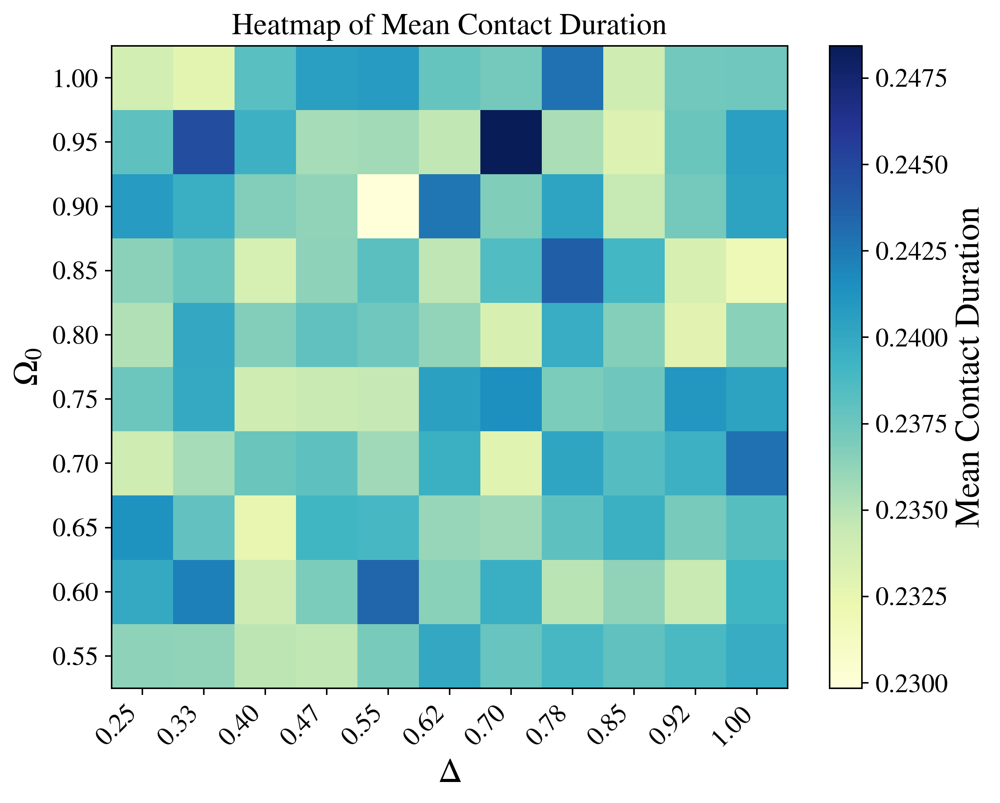

In [6]:
# dict -> pivot table
df_heat = (
    pd.Series(mean_contact_duration)
      .reset_index()
      .rename(columns={"level_0":"omega0", "level_1":"delta", 0:"mean_duration"})
      .pivot(index="omega0", columns="delta", values="mean_duration")
      .sort_index().sort_index(axis=1)
)

fig, ax = plt.subplots(figsize=(7.5,6), dpi = 350)

# plot in index space (no extent)
im = ax.imshow(df_heat.values, origin="lower", aspect="auto",
               interpolation="nearest", cmap="YlGnBu")

# label ticks with the actual parameter values
ax.set_xticks(np.arange(df_heat.shape[1]))
ax.set_xticklabels([f"{c:.2f}" for c in df_heat.columns], rotation=45, ha="right")
ax.set_yticks(np.arange(df_heat.shape[0]))
ax.set_yticklabels([f"{r:.2f}" for r in df_heat.index])

ax.set_xlabel(fr"$\Delta$")
ax.set_ylabel(fr"$\Omega_{0}$")
ax.set_title("Heatmap of Mean Contact Duration")

cbar = fig.colorbar(im, ax=ax)
cbar.set_label("Mean Contact Duration")

plt.tight_layout()
plt.show()

### contact duration for the killed and survived target cells


```python
def total_contact_time(sub_hah: pd.DataFrame) -> float:
    """
    Given one target cell's trajectory sub_hah (columns: time, contacts),
    compute the total time spent in contact with any killer.
    """
    df = sub_hah.sort_values(by="time").reset_index(drop=True)

    # robustly handle contacts as list/tuple/np.array or stringified JSON
    def _len_contacts(x):
        if isinstance(x, (list, tuple, np.ndarray)): 
            return len(x)
        if isinstance(x, str):
            s = x.strip()
            if not s or s.lower() == "nan" or s == "[]":
                return 0
            try:
                v = json.loads(s)
                return len(v) if isinstance(v, (list, tuple)) else (1 if v is not None else 0)
            except Exception:
                return 0
        return 0 if x is None else int(bool(x))

    in_contact = df["contacts"].apply(_len_contacts).to_numpy(dtype=int) > 0

    # find contiguous True runs
    diff   = np.diff(in_contact.astype(int), prepend=0, append=0)
    starts = np.flatnonzero(diff == 1)     # inclusive
    ends   = np.flatnonzero(diff == -1)    # exclusive (first index AFTER contact)

    t = df["time"].to_numpy(dtype=float)
    total_time = 0.0
    for s, e in zip(starts, ends):
        if s >= len(t): 
            continue
        t0 = t[s]
        t1 = t[e] if e < len(t) else t[-1]  # use the first index *after* contact as the end
        total_time += (t1 - t0)
    return float(total_time)

duration_lethalORnot = {}
for (om, de), subdf in tqdm(df.groupby(["omega0", "delta"]), desc= "grid"):
    lethal_duration = []
    non_lethal_duration = []
    for i, subsubdf in tqdm(subdf.groupby("replicate"), desc = "replicate", leave=False):
        target_subsubdf = subsubdf.query("cell_type == 'target'")
        for i, sub_hah in target_subsubdf.groupby('cell_id'):
            last_status = sub_hah.sort_values(by='time').iloc[-1]["alive_status"]
            if not last_status:
                tot_time = total_contact_time(sub_hah)
                lethal_duration.append(tot_time)
            if last_status:
                tot_time = total_contact_time(sub_hah)
                non_lethal_duration.append(tot_time)
    duration_lethalORnot[(om, de, "lethal")] = np.mean(lethal_duration) if lethal_duration else np.nan
    duration_lethalORnot[(om, de, "nonlethal")] = np.mean(non_lethal_duration) if non_lethal_duration else np.nan

```

In [7]:
def _mean_durations_one_replicate(subdf_one_rep: pd.DataFrame) -> tuple[float, float]:
    """
    For a single (omega0, delta, replicate) slice:
    returns (mean_lethal_duration, mean_nonlethal_duration)
    where lethal = targets dead at final timepoint, nonlethal = alive at final.
    """
    tgt = subdf_one_rep[subdf_one_rep["cell_type"] == "target"].copy()
    if tgt.empty:
        return (np.nan, np.nan)

    # last status per target
    last_rows = tgt.sort_values("time").groupby("cell_id", sort=False).tail(1)
    is_dead = ~last_rows["alive_status"].astype(bool)
    dead_ids = set(last_rows.loc[is_dead, "cell_id"].tolist())
    alive_ids = set(last_rows.loc[~is_dead, "cell_id"].tolist())

    lethal_durs = []
    nonlethal_durs = []

    # compute total contact time per target
    for cid, sub_hah in tgt.groupby("cell_id", sort=False):
        dur = total_contact_time(sub_hah)
        if cid in dead_ids:
            lethal_durs.append(dur)
        elif cid in alive_ids:
            nonlethal_durs.append(dur)

    mean_lethal    = float(np.mean(lethal_durs))    if len(lethal_durs)    else np.nan
    mean_nonlethal = float(np.mean(nonlethal_durs)) if len(nonlethal_durs) else np.nan
    return (mean_lethal, mean_nonlethal)


def compute_lethal_nonlethal_means(df: pd.DataFrame, n_jobs: int = -1):
    """
    Returns a dict keyed by (omega0, delta, kind) -> mean duration,
    where kind in {"lethal", "nonlethal"}.
    """
    out = {}

    for (om, de), subdf in tqdm(df.groupby(["omega0", "delta"], sort=False), desc="grid"):
        # parallel over replicates *within* this grid point
        results = Parallel(n_jobs=n_jobs, backend="loky")(
            delayed(_mean_durations_one_replicate)(rep_df)
            for _, rep_df in subdf.groupby("replicate", sort=False)
        )
        # unpack
        lethal_vals    = [x[0] for x in results if not np.isnan(x[0])]
        nonlethal_vals = [x[1] for x in results if not np.isnan(x[1])]

        out[(om, de, "lethal")]    = float(np.mean(lethal_vals))    if lethal_vals    else np.nan
        out[(om, de, "nonlethal")] = float(np.mean(nonlethal_vals)) if nonlethal_vals else np.nan

    return out

duration_lethalORnot = compute_lethal_nonlethal_means(df, n_jobs=4)

grid:   0%|          | 0/110 [00:00<?, ?it/s]

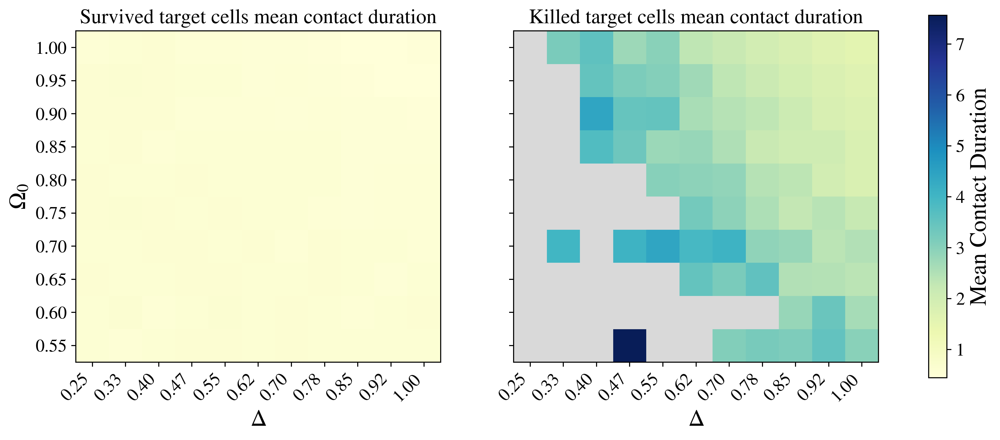

In [8]:
# --- 1) dict -> long dataframe
df_heat = (
    pd.Series(duration_lethalORnot)
      .reset_index()
      .rename(columns={
          "level_0": "omega0",
          "level_1": "delta",
          "level_2": "kind",
          0: "mean_duration"
      })
)

# --- 2) separate lethal / non-lethal and pivot
heat_nonlethal = (
    df_heat[df_heat["kind"] == "nonlethal"]
      .pivot(index="omega0", columns="delta", values="mean_duration")
)

heat_lethal = (
    df_heat[df_heat["kind"] == "lethal"]
      .pivot(index="omega0", columns="delta", values="mean_duration")
)

# --- 3) align grids so both panels show the same ω0×Δ matrix
all_omega0 = sorted(set(heat_nonlethal.index).union(heat_lethal.index))
all_delta  = sorted(set(heat_nonlethal.columns).union(heat_lethal.columns))

heat_nonlethal = heat_nonlethal.reindex(index=all_omega0, columns=all_delta)
heat_lethal    = heat_lethal.reindex(index=all_omega0, columns=all_delta)

# --- 4) shared colour scale (ignoring NaNs)
vmin = np.nanmin([heat_nonlethal.values, heat_lethal.values])
vmax = np.nanmax([heat_nonlethal.values, heat_lethal.values])

# mask NaNs so they display as a neutral color
nonlethal_masked = np.ma.masked_invalid(heat_nonlethal.values)
lethal_masked    = np.ma.masked_invalid(heat_lethal.values)

cmap = plt.get_cmap("YlGnBu").copy()
cmap.set_bad(color="#d9d9d9")  # light gray for NaNs

# --- 5) plotting
fig, axes = plt.subplots(1, 2, figsize=(14, 6), dpi=350, sharey=True)

# Left: non-lethal
im0 = axes[0].imshow(
    nonlethal_masked, origin="lower", aspect="equal",
    interpolation="nearest", cmap=cmap, vmin=vmin, vmax=vmax
)
axes[0].set_title("Survived target cells mean contact duration")
axes[0].set_xlabel(r"$\Delta$")

# Right: lethal
im1 = axes[1].imshow(
    lethal_masked, origin="lower", aspect="equal",
    interpolation="nearest", cmap=cmap, vmin=vmin, vmax=vmax
)
axes[1].set_title("Killed target cells mean contact duration")
axes[1].set_xlabel(r"$\Delta$")

# ticks & labels (discrete axes)
for ax, heat in zip(axes, [heat_nonlethal, heat_lethal]):
    ax.set_xticks(np.arange(heat.shape[1]))
    ax.set_xticklabels([f"{c:.2f}" for c in heat.columns], rotation=45, ha="right")
    ax.set_yticks(np.arange(heat.shape[0]))
    ax.set_yticklabels([f"{r:.2f}" for r in heat.index])

axes[0].set_ylabel(r"$\Omega_{0}$")

# one shared colorbar on the right
cbar = fig.colorbar(im1, ax=axes, location="right", shrink=0.85, pad=0.05)
cbar.set_label("Mean Contact Duration")

# plt.tight_layout()
plt.show()

### Death Factor temporal evolution

/var/folders/rr/16wv6ts1785fz6_2qhr5bc2m0000gn/T/ipykernel_21688/1928657205.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap("YlGnBu")
/var/folders/rr/16wv6ts1785fz6_2qhr5bc2m0000gn/T/ipykernel_21688/1928657205.py:37: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  plt.tight_layout()
/Users/marsian/.local/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  fig.canvas.print_figure(bytes_io, **kw)


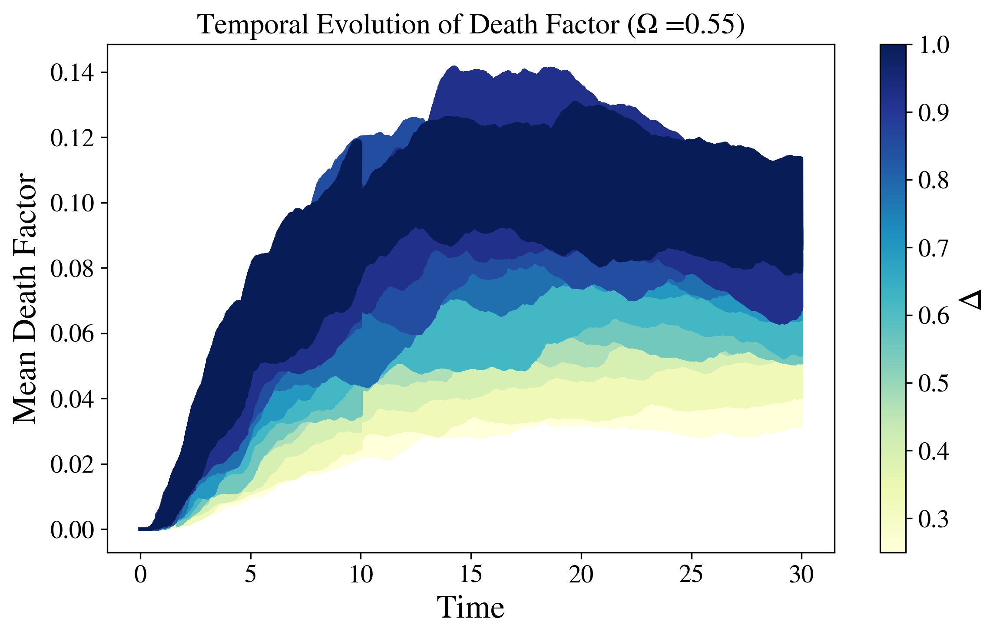

/var/folders/rr/16wv6ts1785fz6_2qhr5bc2m0000gn/T/ipykernel_21688/1928657205.py:37: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  plt.tight_layout()
/Users/marsian/.local/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  fig.canvas.print_figure(bytes_io, **kw)


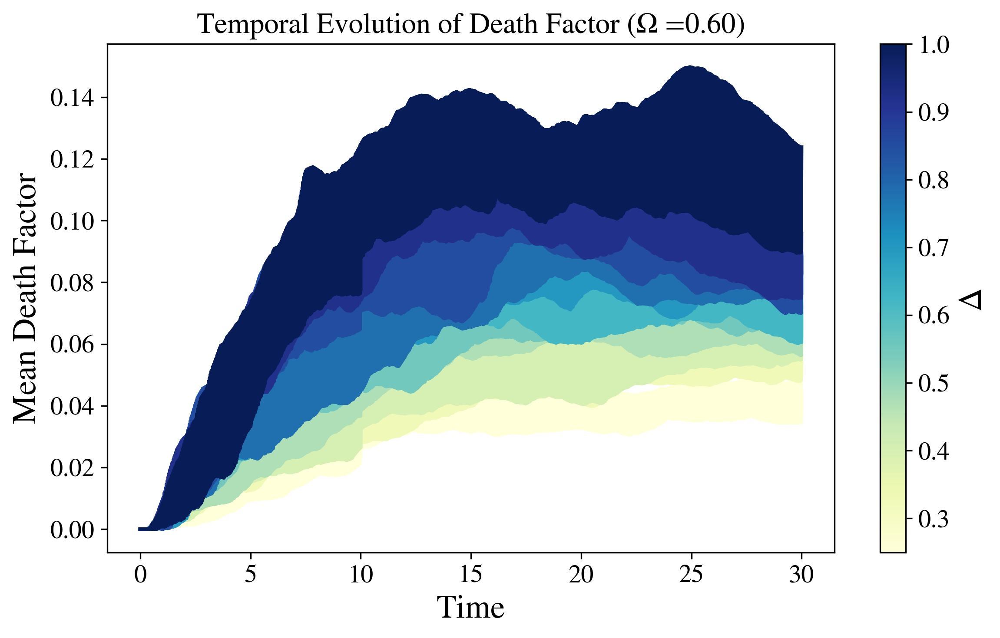

/var/folders/rr/16wv6ts1785fz6_2qhr5bc2m0000gn/T/ipykernel_21688/1928657205.py:37: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  plt.tight_layout()
/Users/marsian/.local/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  fig.canvas.print_figure(bytes_io, **kw)


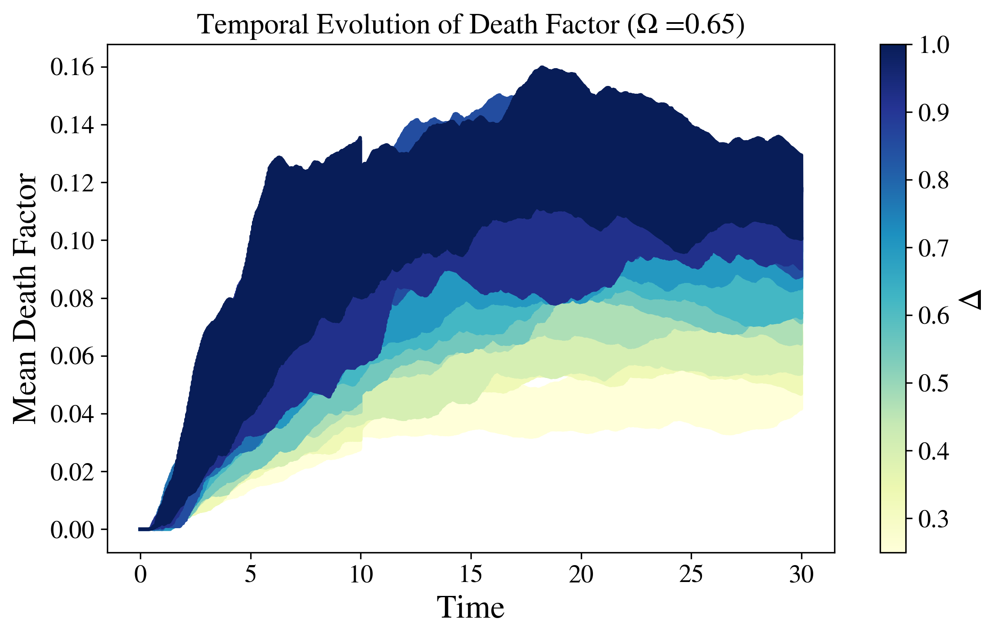

/var/folders/rr/16wv6ts1785fz6_2qhr5bc2m0000gn/T/ipykernel_21688/1928657205.py:37: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  plt.tight_layout()
/Users/marsian/.local/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  fig.canvas.print_figure(bytes_io, **kw)


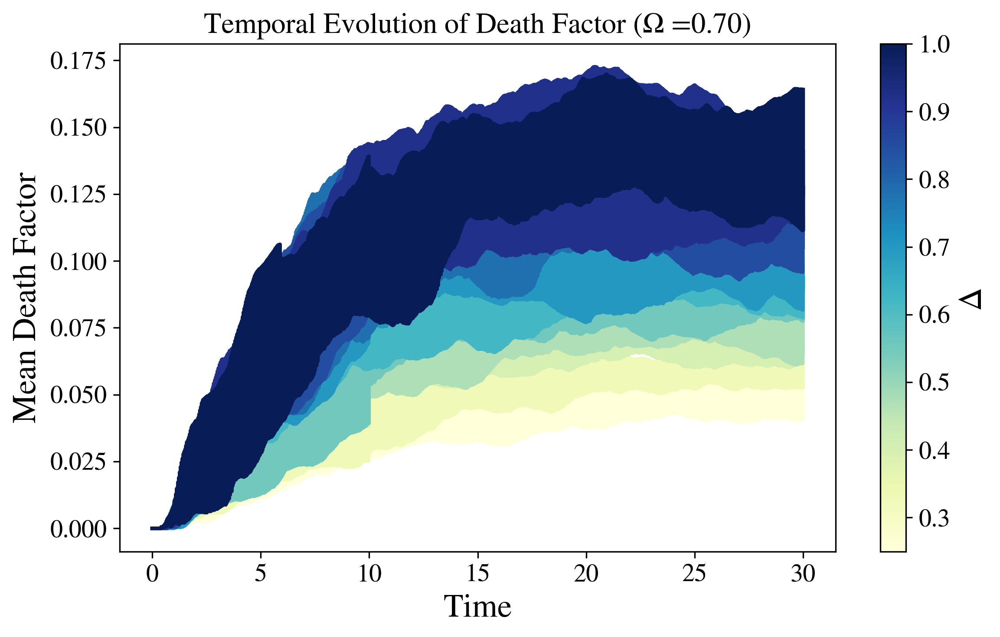

/var/folders/rr/16wv6ts1785fz6_2qhr5bc2m0000gn/T/ipykernel_21688/1928657205.py:37: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  plt.tight_layout()
/Users/marsian/.local/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  fig.canvas.print_figure(bytes_io, **kw)


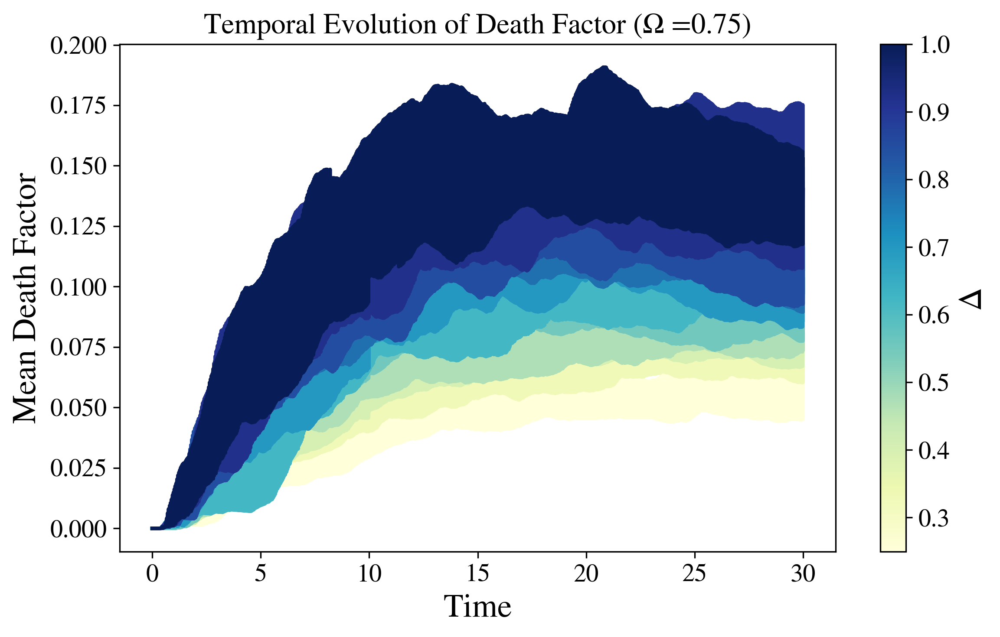

/var/folders/rr/16wv6ts1785fz6_2qhr5bc2m0000gn/T/ipykernel_21688/1928657205.py:37: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  plt.tight_layout()
/Users/marsian/.local/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  fig.canvas.print_figure(bytes_io, **kw)


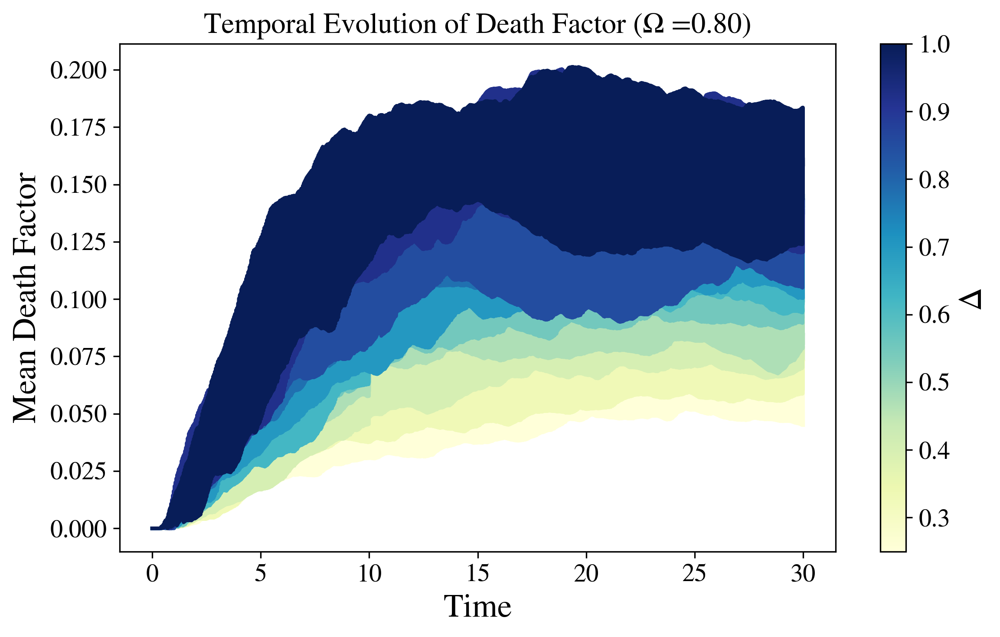

/var/folders/rr/16wv6ts1785fz6_2qhr5bc2m0000gn/T/ipykernel_21688/1928657205.py:37: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  plt.tight_layout()
/Users/marsian/.local/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  fig.canvas.print_figure(bytes_io, **kw)


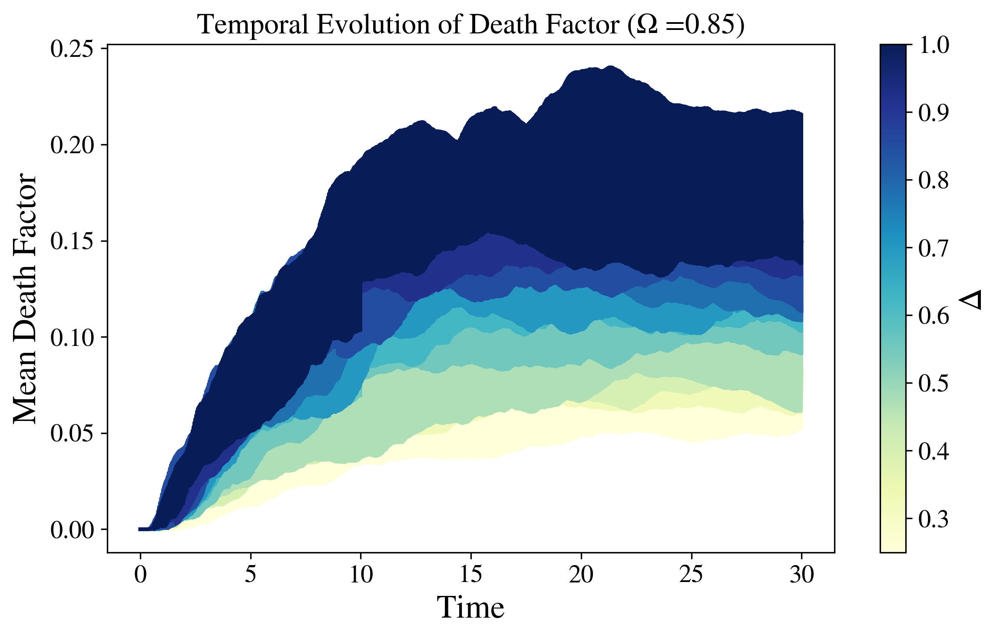

/var/folders/rr/16wv6ts1785fz6_2qhr5bc2m0000gn/T/ipykernel_21688/1928657205.py:37: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  plt.tight_layout()
/Users/marsian/.local/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  fig.canvas.print_figure(bytes_io, **kw)


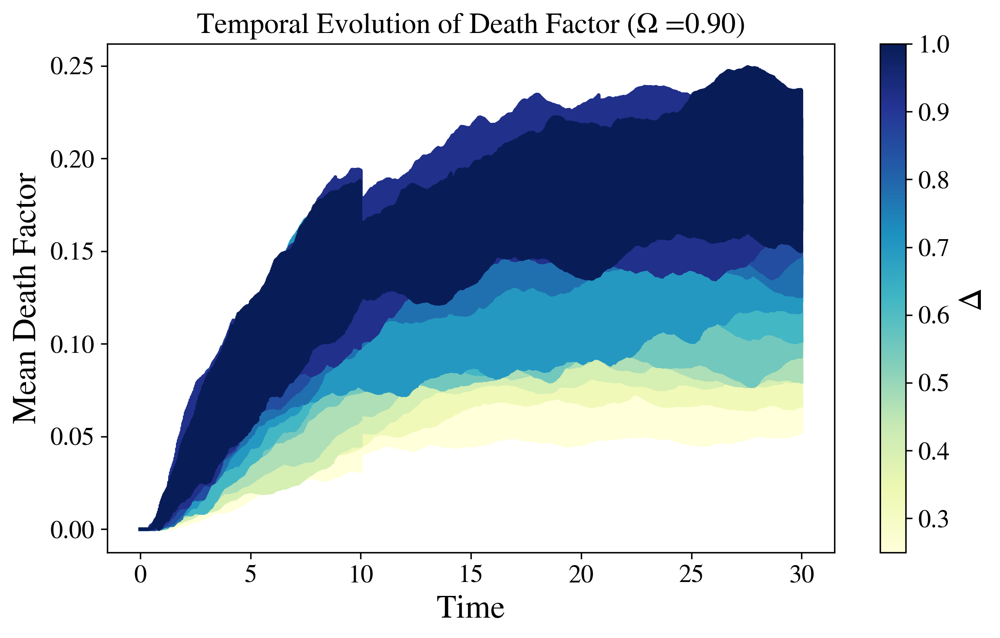

/var/folders/rr/16wv6ts1785fz6_2qhr5bc2m0000gn/T/ipykernel_21688/1928657205.py:37: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  plt.tight_layout()
/Users/marsian/.local/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  fig.canvas.print_figure(bytes_io, **kw)


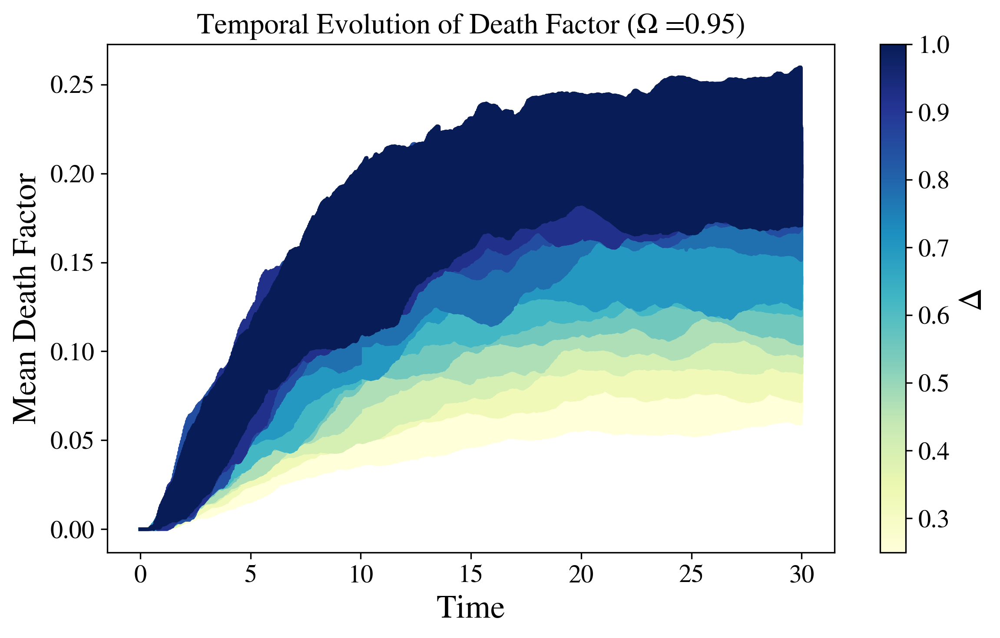

/var/folders/rr/16wv6ts1785fz6_2qhr5bc2m0000gn/T/ipykernel_21688/1928657205.py:37: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  plt.tight_layout()
/Users/marsian/.local/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  fig.canvas.print_figure(bytes_io, **kw)


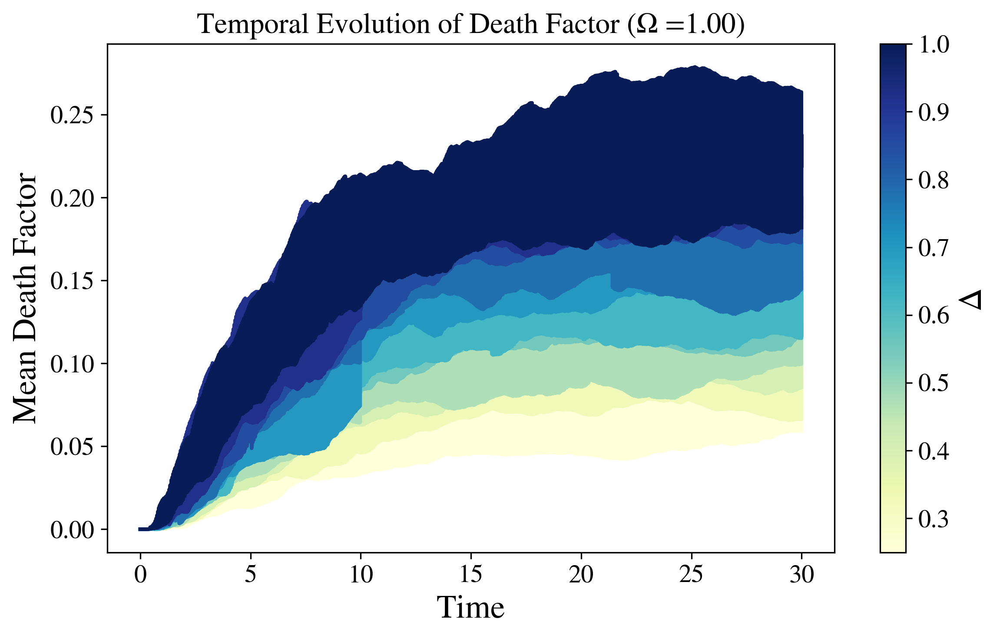

In [9]:
from matplotlib.cm import get_cmap
from matplotlib.colors import Normalize

# filter only target cells
dft = df[df["cell_type"] == "target"].copy()

cmap = get_cmap("YlGnBu")

for om in sorted(dft["omega0"].unique()):
    sub = dft[dft["omega0"] == om]

    # collapse replicates + targets -> one mean per (delta, time)
    mean_ts = (
        sub.groupby(["delta", "time"])["Death_Factor"]
           .mean()
           .reset_index()
    )

    deltas = sorted(mean_ts["delta"].unique())
    norm   = Normalize(vmin=min(deltas), vmax=max(deltas))

    fig, ax = plt.subplots(figsize=(8, 5), dpi=300)

    for de in deltas:
        curve = mean_ts[mean_ts["delta"] == de].sort_values("time")
        ax.plot(curve["time"], curve["Death_Factor"],
                color=cmap(norm(de)), lw=2)

    ax.set_title(fr"Temporal Evolution of Death Factor (Ω₀={om:.2f})")
    ax.set_xlabel("Time")
    ax.set_ylabel("Mean Death Factor")

    sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, label="Δ")

    plt.tight_layout()
    plt.show()

/var/folders/rr/16wv6ts1785fz6_2qhr5bc2m0000gn/T/ipykernel_21688/2030789924.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap("YlGnBu")
/var/folders/rr/16wv6ts1785fz6_2qhr5bc2m0000gn/T/ipykernel_21688/2030789924.py:53: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  plt.tight_layout()
/Users/marsian/.local/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  fig.canvas.print_figure(bytes_io, **kw)


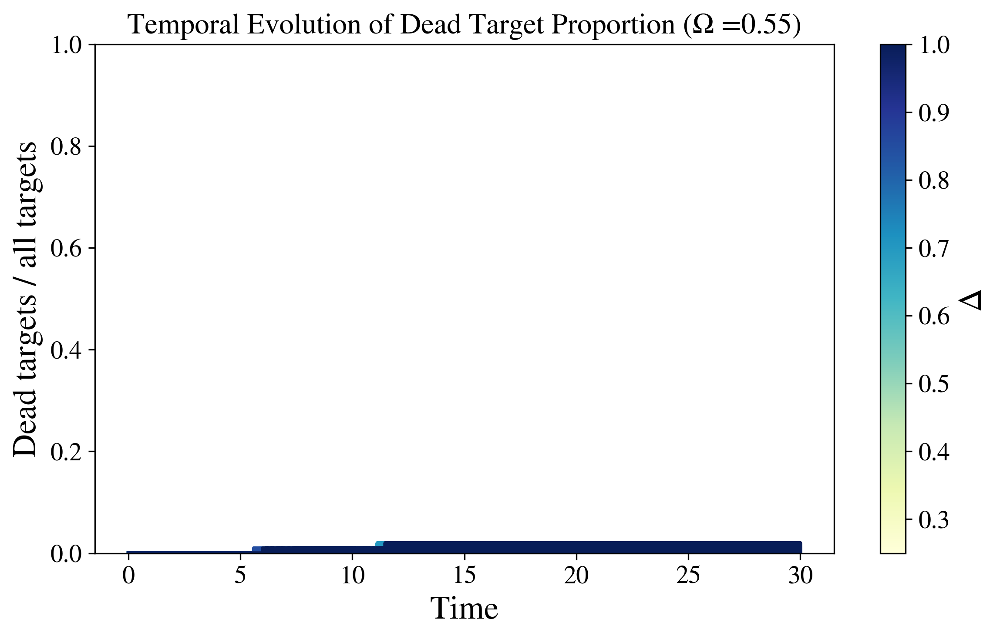

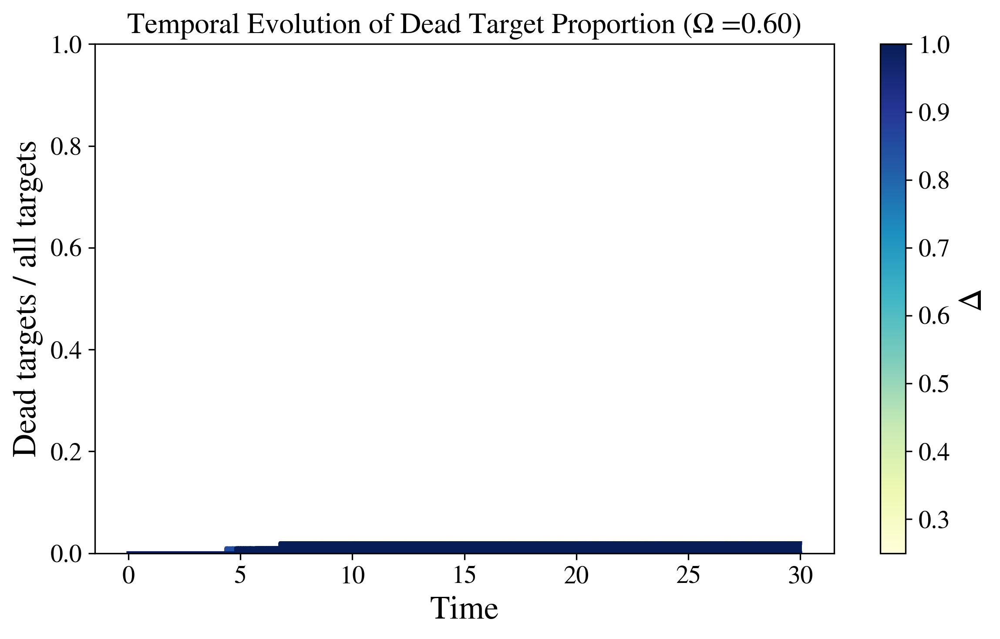

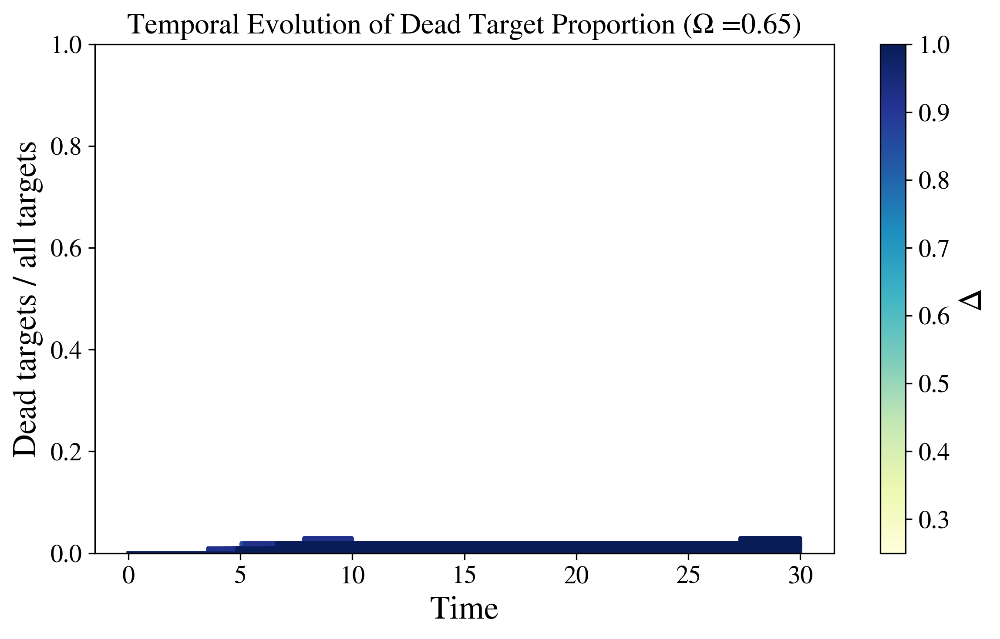

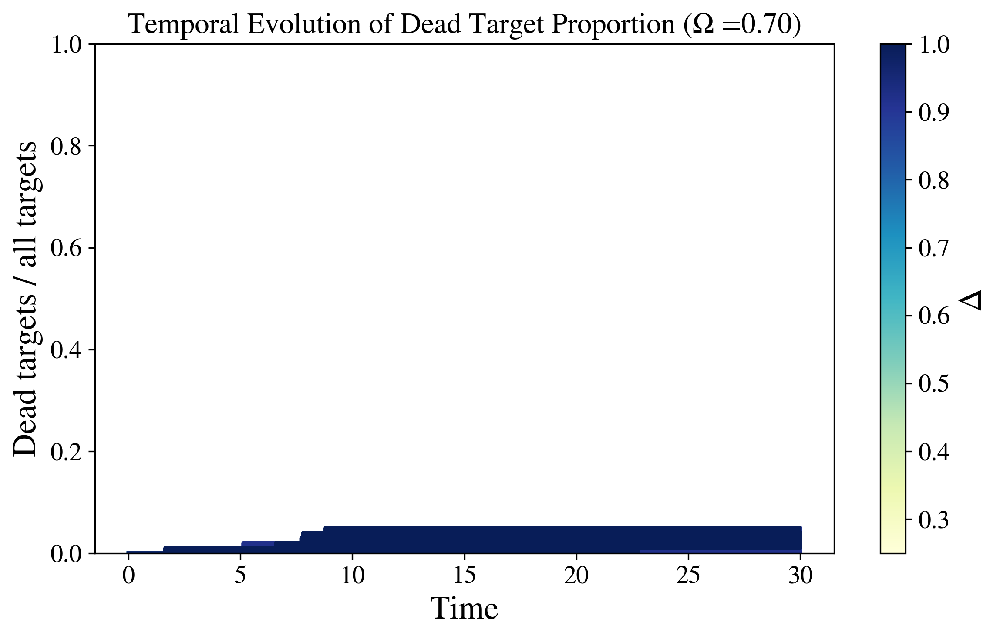

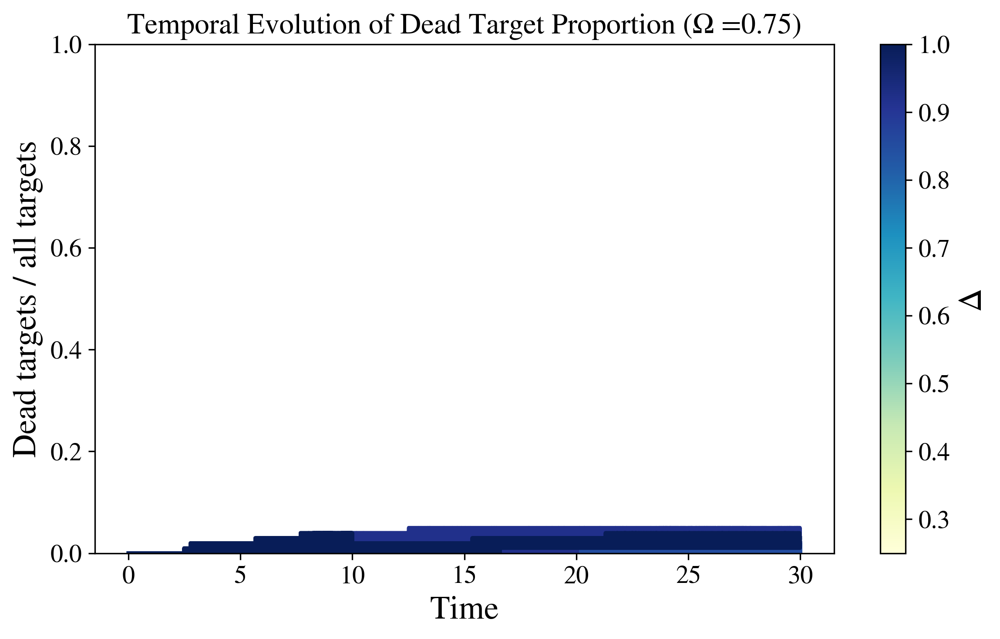

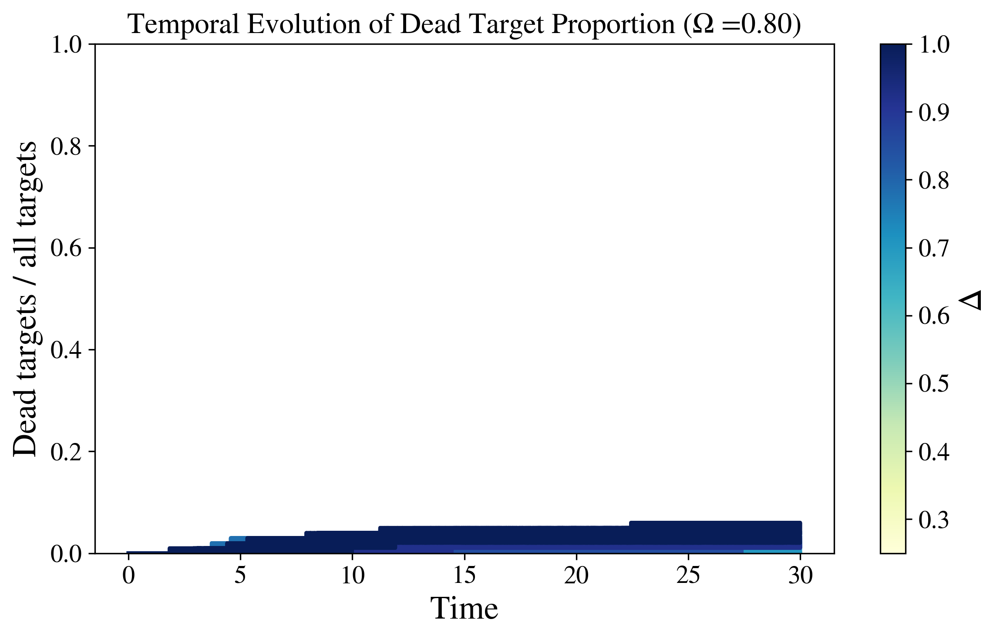

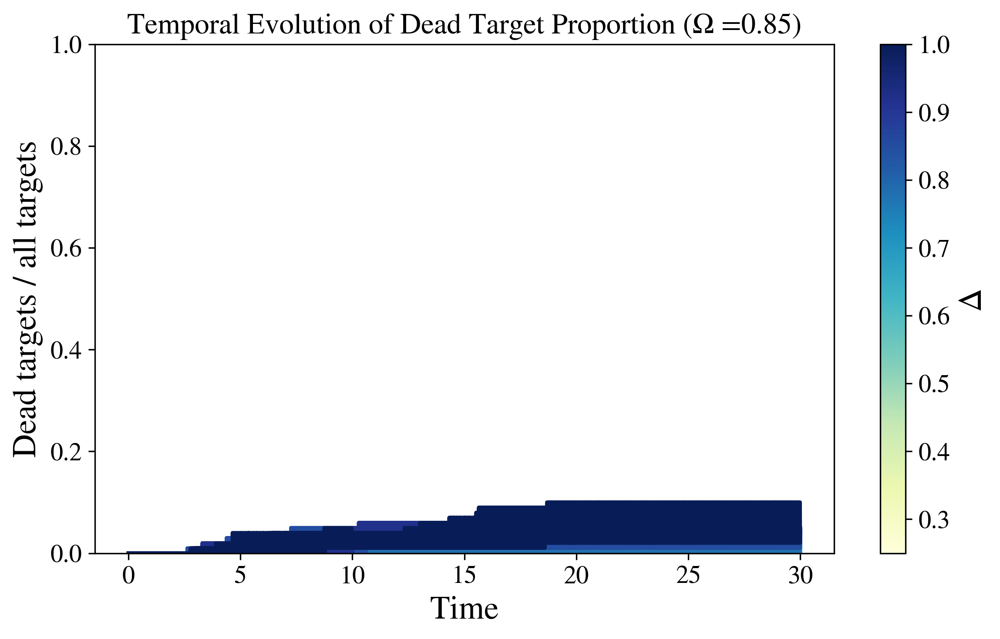

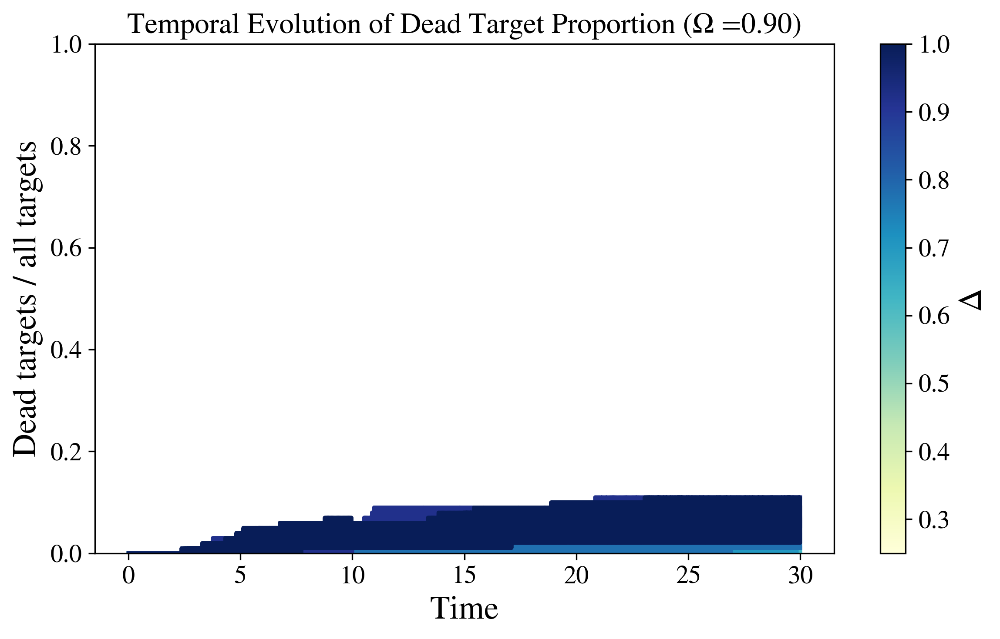

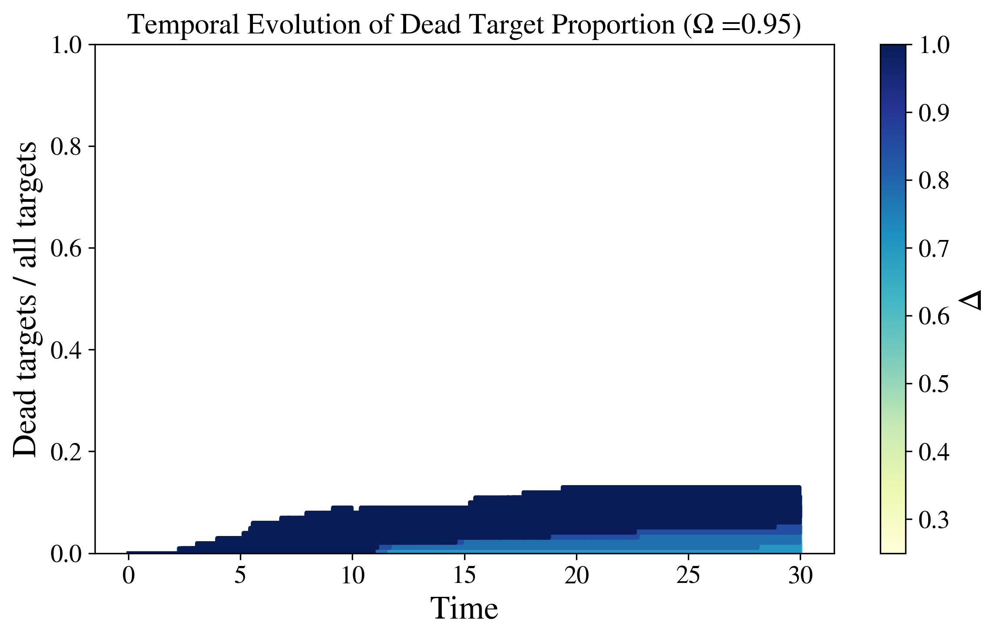

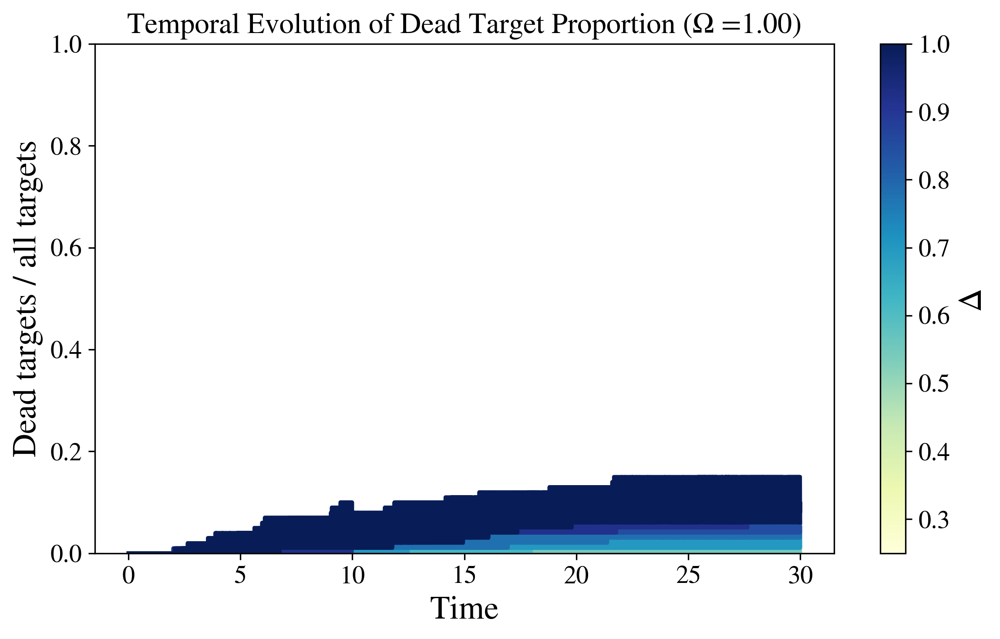

In [10]:
# keep only target rows
dft = df[df["cell_type"] == "target"].copy()

# 1) Per replicate & time: proportion of dead targets
#    (dead = ~alive_status)
per_rep = (
    dft.groupby(["omega0", "delta", "replicate", "time"])["alive_status"]
      .apply(lambda s: (~s.astype(bool)).mean())  # fraction dead in that replicate at that time
      .rename("dead_prop")
      .reset_index()
)

# 2) Aggregate across replicates: mean and std at each (omega0, delta, time)
agg = (
    per_rep.groupby(["omega0", "delta", "time"])["dead_prop"]
           .agg(mean="mean", std="std")
           .reset_index()
)

# plotting: one figure per omega0; many Δ curves per figure
cmap = get_cmap("YlGnBu")

for om in sorted(agg["omega0"].unique()):
    sub = agg[agg["omega0"] == om].copy()

    deltas = sorted(sub["delta"].unique())
    norm   = Normalize(vmin=min(deltas), vmax=max(deltas))

    fig, ax = plt.subplots(figsize=(8, 5), dpi=300)

    for de in deltas:
        cur = sub[sub["delta"] == de].sort_values("time")
        t   = cur["time"].to_numpy()
        m   = cur["mean"].to_numpy()
        s   = cur["std"].fillna(0).to_numpy()  # std can be NaN if only one replicate; show no band then

        color = cmap(norm(de))
        ax.plot(t, m, color=color, lw=2, label=f"Δ={de:.2f}")
        # std band (skip if all zeros)
        if np.any(s > 0):
            ax.fill_between(t, m - s, m + s, color=color, alpha=0.25, linewidth=0)

    ax.set_title(fr"Temporal Evolution of Dead Target Proportion (Ω₀={om:.2f})")
    ax.set_xlabel("Time")
    ax.set_ylabel("Dead targets / all targets")
    ax.set_ylim(0, 1)  # proportions

    # Δ colorbar
    sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, label="Δ")

    plt.tight_layout()
    plt.show()

/var/folders/rr/16wv6ts1785fz6_2qhr5bc2m0000gn/T/ipykernel_21688/3897504820.py:66: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  plt.tight_layout(rect=(0.04, 0.04, 1, 0.98))
/Users/marsian/.local/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  fig.canvas.print_figure(bytes_io, **kw)


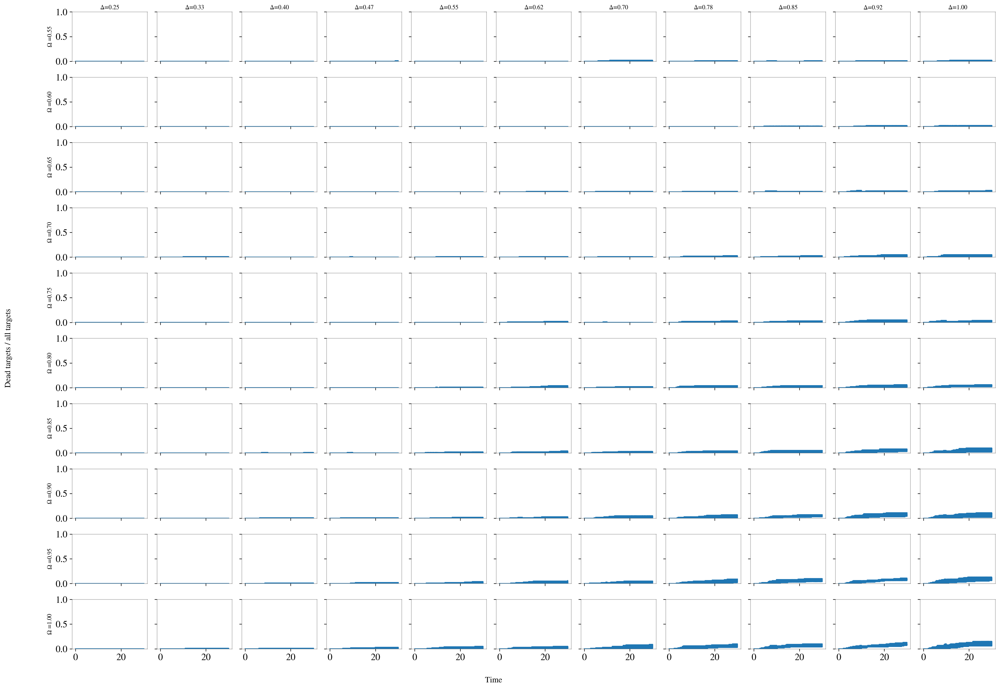

In [11]:
# --- 0) keep only target rows
dft = df[df["cell_type"] == "target"].copy()

# --- 1) per replicate & time: proportion of dead targets
per_rep = (
    dft.groupby(["omega0", "delta", "replicate", "time"])["alive_status"]
       .apply(lambda s: (~s.astype(bool)).mean())  # fraction dead in that replicate at that time
       .rename("dead_prop")
       .reset_index()
)

# --- 2) aggregate across replicates: mean & std at each (omega0, delta, time)
agg = (
    per_rep.groupby(["omega0", "delta", "time"])["dead_prop"]
           .agg(mean="mean", std="std")
           .reset_index()
)

# --- 3) grid axes: rows=omega0, cols=delta
omega_vals = sorted(agg["omega0"].unique())
delta_vals = sorted(agg["delta"].unique())

nrows, ncols = len(omega_vals), len(delta_vals)
fig, axes = plt.subplots(
    nrows=nrows, ncols=ncols, figsize=(1.9*ncols, 1.5*nrows), dpi=300, sharex=True, sharey=True
)
if nrows == 1 and ncols == 1:
    axes = np.array([[axes]])
elif nrows == 1:
    axes = axes[np.newaxis, :]
elif ncols == 1:
    axes = axes[:, np.newaxis]

# --- 4) draw each tiny timeseries
for r, om in enumerate(omega_vals):
    for c, de in enumerate(delta_vals):
        ax = axes[r, c]
        cur = agg[(agg["omega0"] == om) & (agg["delta"] == de)].sort_values("time")
        if cur.empty:
            ax.axis("off")
            continue
        t = cur["time"].to_numpy()
        m = cur["mean"].to_numpy()
        s = cur["std"].fillna(0).to_numpy()

        ax.plot(t, m, lw=1.5, color="C0")
        if np.any(s > 0):
            ax.fill_between(t, m - s, m + s, color="C0", alpha=0.25, linewidth=0)

        # cosmetics
        ax.set_ylim(0, 1)
        ax.grid(False)
        for spine in ax.spines.values(): spine.set_alpha(0.3)

        # top row: column titles (Δ)
        if r == 0:
            ax.set_title(f"Δ={de:.2f}", fontsize=9, pad=4)
        # first col: row labels (Ω0)
        if c == 0:
            ax.set_ylabel(fr"Ω₀={om:.2f}", fontsize=9)

# common x/y labels
fig.supxlabel("Time", y=0.04)
fig.supylabel("Dead targets / all targets", x=0.02)

plt.tight_layout(rect=(0.04, 0.04, 1, 0.98))
plt.show()

/var/folders/rr/16wv6ts1785fz6_2qhr5bc2m0000gn/T/ipykernel_21688/3607609762.py:69: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  plt.tight_layout(rect=(0.04, 0.04, 1, 0.98))
/Users/marsian/.local/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  fig.canvas.print_figure(bytes_io, **kw)


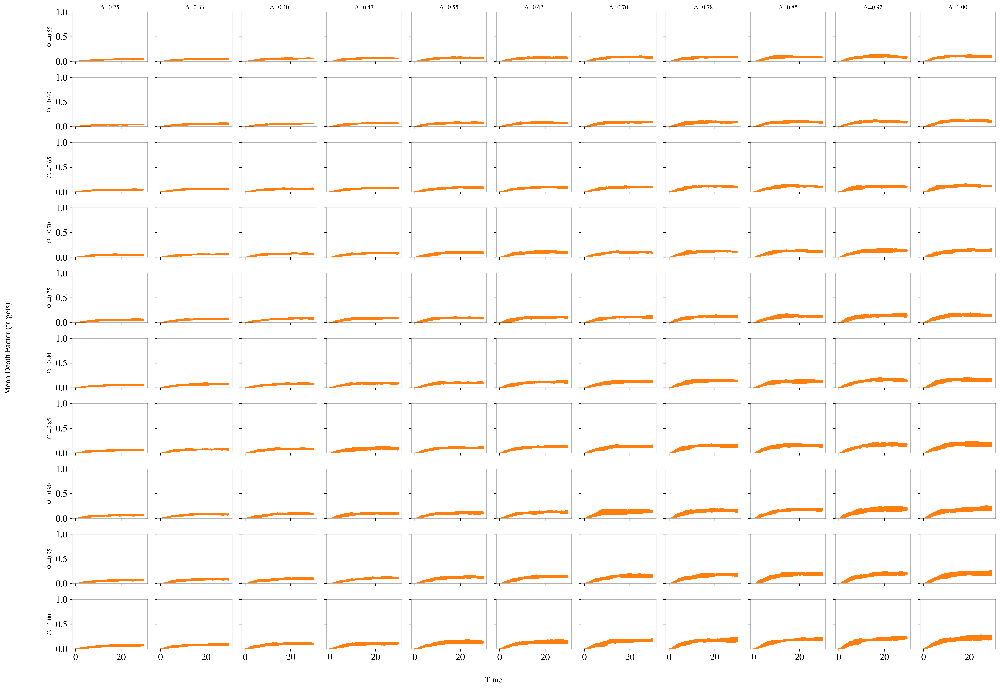

In [12]:
# --- 0) keep only target rows
dft = df[df["cell_type"] == "target"].copy()

# --- 1) per replicate & time: mean Death_Factor over all target cells
per_rep_df = (
    dft.groupby(["omega0", "delta", "replicate", "time"])["Death_Factor"]
       .mean()                         # average across targets in that replicate at that time
       .rename("df_mean_rep")
       .reset_index()
)

# --- 2) aggregate across replicates: mean & std at each (omega0, delta, time)
agg_df = (
    per_rep_df.groupby(["omega0", "delta", "time"])["df_mean_rep"]
              .agg(mean="mean", std="std")
              .reset_index()
)

# --- 3) grid axes: rows = omega0, cols = delta
omega_vals = sorted(agg_df["omega0"].unique())
delta_vals = sorted(agg_df["delta"].unique())

nrows, ncols = len(omega_vals), len(delta_vals)
fig, axes = plt.subplots(
    nrows=nrows, ncols=ncols, figsize=(1.9*ncols, 1.5*nrows),
    dpi=300, sharex=True, sharey=True
)
if nrows == 1 and ncols == 1:
    axes = np.array([[axes]])
elif nrows == 1:
    axes = axes[np.newaxis, :]
elif ncols == 1:
    axes = axes[:, np.newaxis]

# --- 4) draw each tiny timeseries
for r, om in enumerate(omega_vals):
    for c, de in enumerate(delta_vals):
        ax = axes[r, c]
        cur = agg_df[(agg_df["omega0"] == om) & (agg_df["delta"] == de)].sort_values("time")
        if cur.empty:
            ax.axis("off")
            continue

        t = cur["time"].to_numpy()
        m = cur["mean"].to_numpy()
        s = cur["std"].fillna(0).to_numpy()

        ax.plot(t, m, lw=1.5, color="C1")
        if np.any(s > 0):
            ax.fill_between(t, m - s, m + s, color="C1", alpha=0.25, linewidth=0)

        # cosmetics
        ax.set_ylim(0, 1)  # Death_Factor is capped at 1 in your sim
        ax.grid(False)
        for spine in ax.spines.values():
            spine.set_alpha(0.3)

        # top row titles (Δ)
        if r == 0:
            ax.set_title(f"Δ={de:.2f}", fontsize=9, pad=4)
        # first column y-labels (Ω0)
        if c == 0:
            ax.set_ylabel(fr"Ω₀={om:.2f}", fontsize=9)

# common labels
fig.supxlabel("Time", y=0.04)
fig.supylabel("Mean Death Factor (targets)", x=0.02)

plt.tight_layout(rect=(0.04, 0.04, 1, 0.98))
plt.show()

In [17]:
def extract_contact_durations(df):
    if df.empty:
        return []

    # sort frames by time (stable on step)
    df = df.sort_values(["time", "step"], kind="mergesort").reset_index(drop=True)

    def _to_list(x):
        if x is None or (isinstance(x, float) and np.isnan(x)): return []
        if isinstance(x, (list, tuple)): return list(x)
        if isinstance(x, str):
            s = x.strip()
            if not s or s.lower() == "nan": return []
            try:
                v = json.loads(s)
                return v if isinstance(v, list) else [v]
            except Exception:
                # fallback: split comma-delimited strings like "1,2,3"
                parts = [p.strip() for p in s.split(",") if p.strip()]
                return parts if parts else [s]
        return [x]

    def _pid(item):
        # int-like
        if isinstance(item, (int, np.integer)): return int(item)
        if isinstance(item, str) and item.isdigit(): return int(item)
        # dict-like
        if isinstance(item, dict):
            for k in ("id","cell_id","partner","partner_id"):
                if k in item:
                    try: return int(item[k])
                    except Exception: return None
            return None
        # list/tuple -> first element as id
        if isinstance(item, (list, tuple)) and len(item) >= 1:
            try: return int(item[0])
            except Exception: return None
        return None

    durations = []
    active = {}  # pair(tuple) -> start_time

    # iterate per unique time frame
    for t, frame in df.groupby("time", sort=True):
        t = float(t)
        # map id -> type to filter killer-target pairs
        id2type = frame.set_index("cell_id")["cell_type"].to_dict()

        # build set of unordered pairs present at this time
        pairs_now = set()
        for _, row in frame.iterrows():
            a_id = int(row["cell_id"])
            a_type = row["cell_type"]
            # candidate partners
            for it in _to_list(row.get("contacts", [])):
                b_id = _pid(it)
                if b_id is None: 
                    continue
                b_type = id2type.get(b_id)
                if b_type is None or b_type == a_type:
                    continue  # must be killer-target
                pair = (a_id, b_id) if a_id < b_id else (b_id, a_id)
                pairs_now.add(pair)

        # starts: in now, not in active
        for p in pairs_now.difference(active.keys()):
            active[p] = t

        # ends: in active, not in now
        for p in [p for p in active.keys() if p not in pairs_now]:
            start = active.pop(p)
            if t >= start:
                durations.append(t - start)

    # close any contacts still active at final time
    final_time = float(df["time"].iloc[-1])
    for p, start in list(active.items()):
        if final_time >= start:
            durations.append(final_time - start)
    active.clear()

    return durations

In [18]:
mean_contact_duration = {}
for (om, de), subdf in df.groupby(["omega0", "delta"]):
    print(f"Processing omega0={om}, delta={de}")
    duration_list_specific = []
    for i, subsubdf in df.groupby("replicate"):
        print(extract_contact_durations(subsubdf))
    

Processing omega0=0.5, delta=0.25
[0.19999999999999996, 0.19999999999999996, 0.19999999999999996, 0.09999999999999998, 0.09999999999999998, 0.09999999999999998, 0.09999999999999998, 0.09999999999999998, 0.09999999999999998, 0.09999999999999998, 0.09999999999999998, 0.09999999999999998, 0.09999999999999998, 0.09999999999999998, 0.20000827884944117, 0.20000827884944117, 0.10000827884944119, 0.10000827884944119, 0.10000827884944119, 0.10000827884944119, 0.10000827884944119, 0.10000827884944119, 0.10000827884944119, 0.10000827884944119, 0.10000827884944119, 0.10000827884944119, 0.10000827884944119, 0.10000827884944119, 0.10000827884944119, 0.10000827884944119, 0.10000827884944119, 0.10000827884944119, 0.10000827884944119, 0.10000827884944119, 0.10000827884944119, 0.10000827884944119, 0.10000827884944119, 0.10000827884944119, 0.10000827884944119, 0.10000827884944119, 0.10000827884944119, 0.10000827884944119, 0.10000827884944119, 0.10000827884944119, 0.10000827884944119, 0.10000827884944119,

KeyboardInterrupt: 

In [ ]:
# for (om, de), subdf in df.groupby(["omega0", "delta"]):

In [13]:
import json
import numpy as np
import pandas as pd

# ---------- helpers to make data consistent ----------

def _to_list(x):
    """Return a Python list for a contacts cell. Accept list, tuple, JSON string or NaN."""
    if x is None or (isinstance(x, float) and np.isnan(x)):
        return []
    if isinstance(x, (list, tuple)):
        return list(x)
    if isinstance(x, str):
        s = x.strip()
        if s == "" or s.lower() == "nan":
            return []
        # try JSON
        try:
            v = json.loads(s)
            return v if isinstance(v, list) else [v]
        except Exception:
            # last resort: treat as single token
            return [s]
    # unknown object -> stringify
    return [str(x)]

def _extract_contact(item):
    """
    Try to extract (duration, lethal_flag) from one contact item.
    Accepts:
      - dict with keys 'duration' and optional 'lethal'/'killed'
      - list/tuple [*, duration, lethal?]
      - scalar -> returns (None, None)
    """
    # dict-like
    if isinstance(item, dict):
        dur = item.get("duration", item.get("dur", item.get("t", None)))
        lethal = item.get("lethal", item.get("killed", item.get("is_lethal", None)))
        try:
            dur = float(dur) if dur is not None else None
        except Exception:
            dur = None
        if isinstance(lethal, str):
            lethal = lethal.lower() in {"true", "1", "yes"}
        elif lethal is not None:
            lethal = bool(lethal)
        return dur, lethal

    # list/tuple
    if isinstance(item, (list, tuple)):
        if len(item) >= 2:
            dur = item[1]
            try:
                dur = float(dur)
            except Exception:
                dur = None
            lethal = None
            if len(item) >= 3:
                lethal = item[2]
                if isinstance(lethal, str):
                    lethal = lethal.lower() in {"true", "1", "yes"}
                else:
                    lethal = bool(lethal)
            return dur, lethal

    # everything else
    return None, None

# ---------- metric A & B: mean contact & mean lethal-contact durations ----------

def compute_contact_stats(df_one):
    """
    Given a DataFrame for one (omega0, delta, replicate) or any subset,
    return (mean_contact_duration, mean_lethal_contact_duration).
    Robust to many contact encodings; ignores rows without usable duration.
    """
    all_durs = []
    lethal_durs = []

    # we can use all rows, or restrict to targets if that's your convention:
    # rows = df_one[df_one.cell_type == "target"]
    rows = df_one

    for contacts_cell in rows["contacts"].apply(_to_list):
        for item in contacts_cell:
            dur, lethal = _extract_contact(item)
            if dur is None:
                continue
            all_durs.append(dur)
            if lethal is True:
                lethal_durs.append(dur)

    mean_contact = float(np.mean(all_durs)) if len(all_durs) else np.nan
    mean_lethal  = float(np.mean(lethal_durs)) if len(lethal_durs) else np.nan
    return mean_contact, mean_lethal

# ---------- metric C: average temporal evolution of Death_Factor ----------

def compute_deathfactor_evolution(df):
    """
    Return tidy table with mean Death_Factor per step, averaged over all cells.
    """
    return (
        df.groupby("step", as_index=False)["Death_Factor"]
          .mean()
          .rename(columns={"Death_Factor": "mean_deathfactor"})
    )

# ---------- metric D: time evolution of proportion of dead targets ----------

def compute_dead_prop_evolution(df):
    """
    Return tidy table with prop_dead per step = (# dead targets / # targets).
    A target is considered 'dead' if alive_status is False (or 0).
    """
    tdf = df[df["cell_type"] == "target"].copy()
    # Treat None/NaN as alive unless alive_status is explicitly False
    tdf["is_dead"] = ~tdf["alive_status"].astype(bool)
    return (
        tdf.groupby("step", as_index=False)["is_dead"]
           .mean()
           .rename(columns={"is_dead": "prop_dead"})
    )

# ---------- run across the whole grid ----------

def analyse_grid(df):
    """
    Returns a summary DataFrame with one row per (omega0, delta, replicate),
    plus two tidy time-series tables averaged across replicates:
      - deathfactor_ts (omega0, delta, step, mean_deathfactor)
      - deadprop_ts    (omega0, delta, step, prop_dead)
    """
    rows = []
    deathfactor_ts = []
    deadprop_ts = []

    # iterate per (omega0, delta, replicate)
    for (o, d, r), sdf in df.groupby(["omega0", "delta", "replicate"], sort=True):
        mean_contact, mean_lethal = compute_contact_stats(sdf)
        deathfactor_evo = compute_deathfactor_evolution(sdf)
        deathfactor_evo.insert(0, "omega0", o)
        deathfactor_evo.insert(1, "delta", d)
        deathfactor_evo.insert(2, "replicate", r)
        deathfactor_ts.append(deathfactor_evo)

        deadprop_evo = compute_dead_prop_evolution(sdf)
        deadprop_evo.insert(0, "omega0", o)
        deadprop_evo.insert(1, "delta", d)
        deadprop_evo.insert(2, "replicate", r)
        deadprop_ts.append(deadprop_evo)

        rows.append({
            "omega0": o, "delta": d, "replicate": r,
            "mean_contact": mean_contact,
            "mean_lethal":  mean_lethal,
        })

    agg = pd.DataFrame(rows)

    # also compute replicate-AVERAGED time series per (omega0, delta)
    df_deathfactor = (
        pd.concat(deathfactor_ts, ignore_index=True)
          .groupby(["omega0","delta","step"], as_index=False)["mean_deathfactor"].mean()
    )
    df_deadprop = (
        pd.concat(deadprop_ts, ignore_index=True)
          .groupby(["omega0","delta","step"], as_index=False)["prop_dead"].mean()
    )
    return agg, df_deathfactor, df_deadprop

# ---- run analysis on your df ----
agg_grid, deathfactor_ts, deadprop_ts = analyse_grid(df)

# quick peek:
agg_grid.head(), deathfactor_ts.head(), deadprop_ts.head()

(   omega0  delta  replicate  mean_contact  mean_lethal
 0     0.5   0.25          0           NaN          NaN
 1     0.5   0.25          1           NaN          NaN
 2     0.5   0.25          2           NaN          NaN
 3     0.5   0.25          3           NaN          NaN
 4     0.5   0.25          4           NaN          NaN,
    omega0  delta  step  mean_deathfactor
 0     0.5   0.25     0          0.000000
 1     0.5   0.25     1          0.000000
 2     0.5   0.25     2          0.000000
 3     0.5   0.25     3          0.000010
 4     0.5   0.25     4          0.000075,
    omega0  delta  step  prop_dead
 0     0.5   0.25     0        0.0
 1     0.5   0.25     1        0.0
 2     0.5   0.25     2        0.0
 3     0.5   0.25     3        0.0
 4     0.5   0.25     4        0.0)

/opt/homebrew/Caskroom/miniforge/base/lib/python3.12/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/opt/homebrew/Caskroom/miniforge/base/lib/python3.12/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)
/opt/homebrew/Caskroom/miniforge/base/lib/python3.12/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/opt/homebrew/Caskroom/miniforge/base/lib/python3.12/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


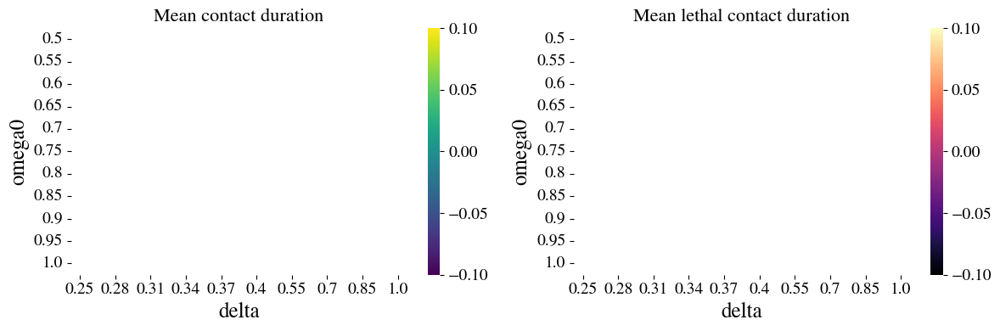

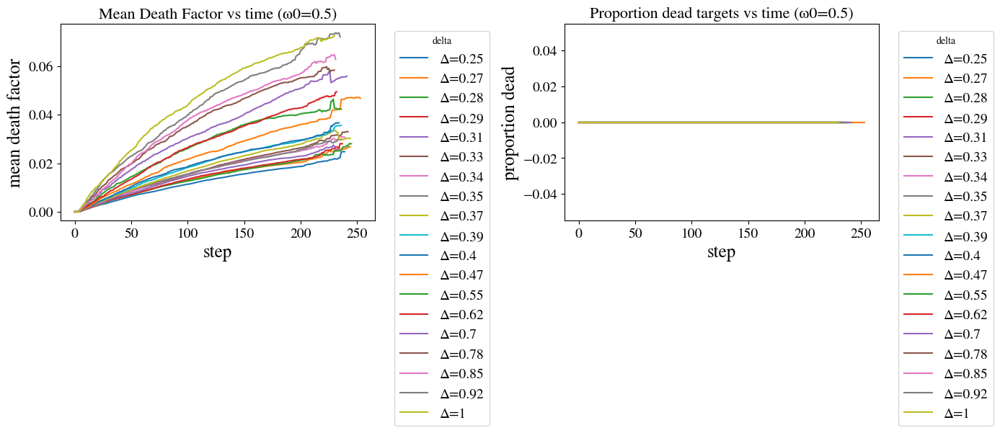

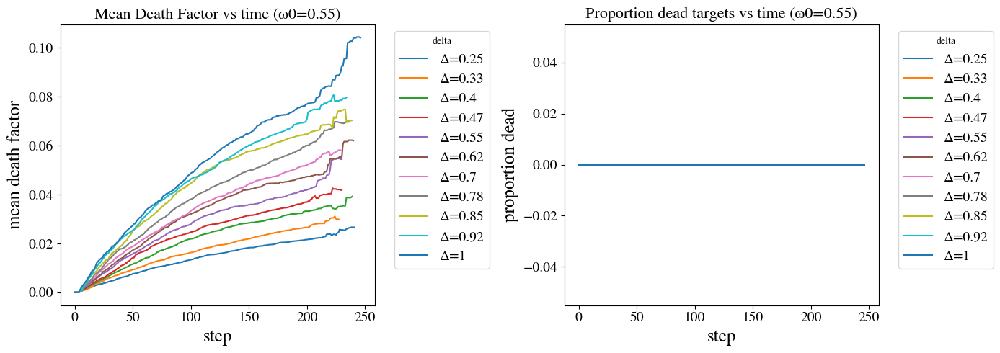

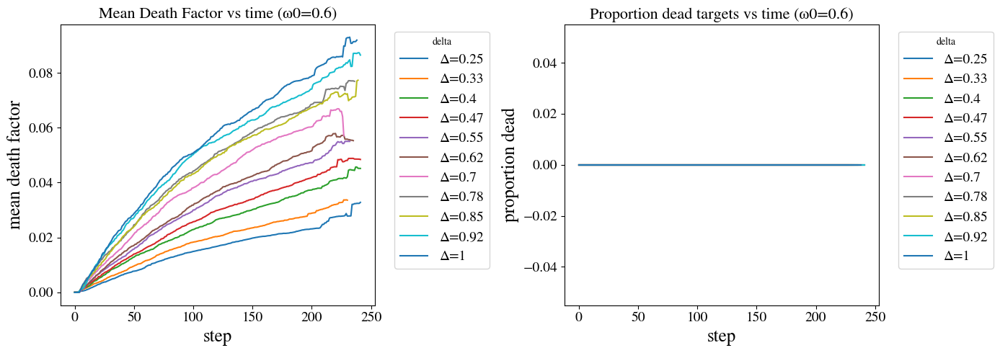

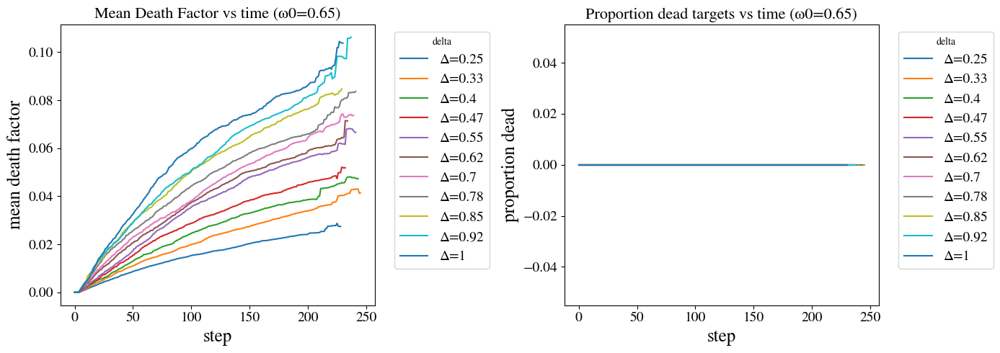

...

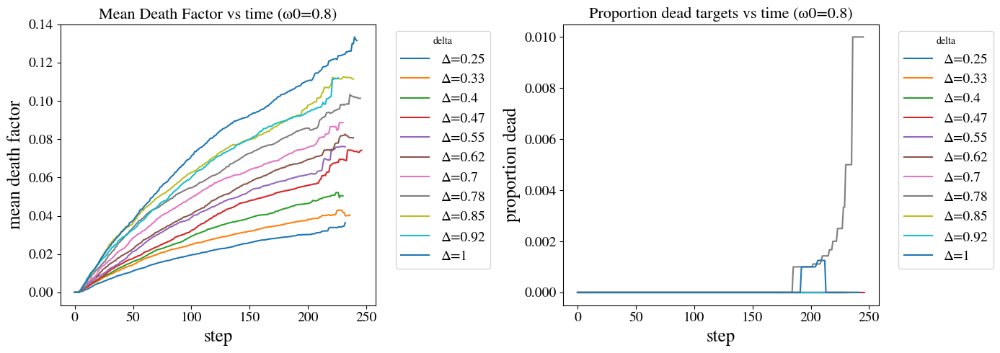

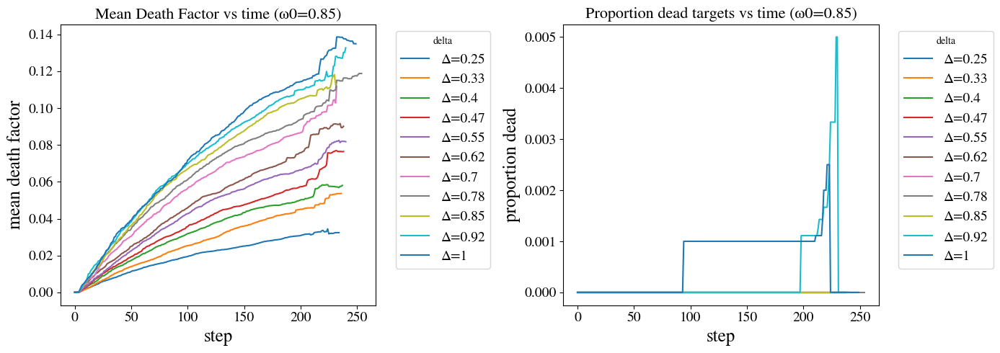

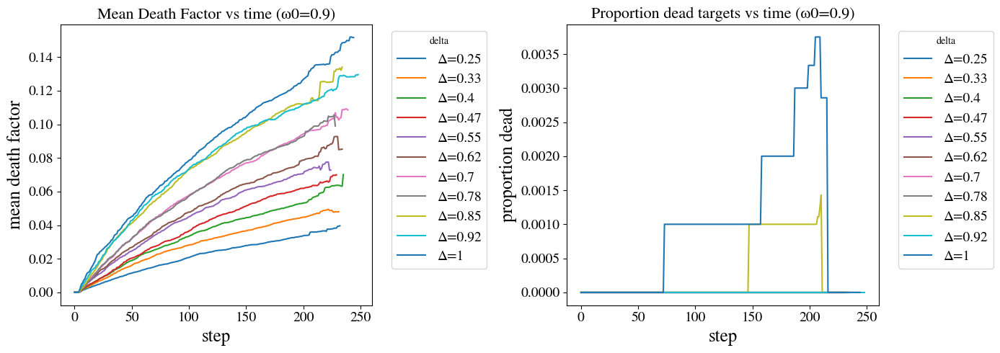

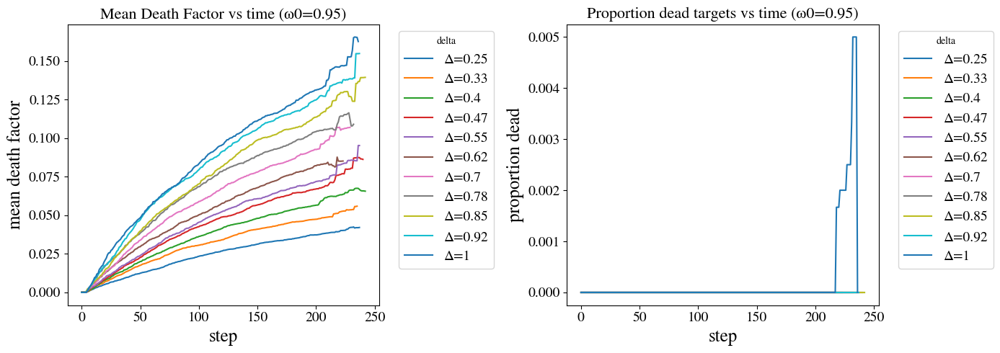

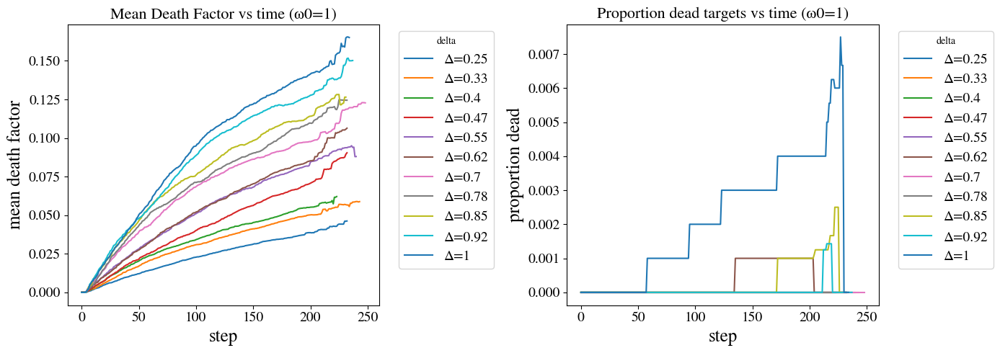

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns

# ---------- A/B: heatmaps over (omega0, delta) ----------

def plot_contact_heatmaps(agg_grid):
    plt.figure(figsize=(12,4))

    plt.subplot(1,2,1)
    pivot1 = agg_grid.groupby(["omega0","delta"])["mean_contact"].mean().unstack()
    sns.heatmap(pivot1, cmap="viridis")
    plt.title("Mean contact duration")
    plt.xlabel("delta"); plt.ylabel("omega0")

    plt.subplot(1,2,2)
    pivot2 = agg_grid.groupby(["omega0","delta"])["mean_lethal"].mean().unstack()
    sns.heatmap(pivot2, cmap="magma")
    plt.title("Mean lethal contact duration")
    plt.xlabel("delta"); plt.ylabel("omega0")

    plt.tight_layout()
    plt.show()

# ---------- C/D: temporal evolution for all delta at a fixed omega0 ----------

def plot_temporal_panels(deathfactor_ts, deadprop_ts, omega0_value):
    df_df = deathfactor_ts[deathfactor_ts["omega0"] == omega0_value]
    df_dp = deadprop_ts[deadprop_ts["omega0"] == omega0_value]

    deltas = sorted(df_df["delta"].unique())

    fig, axes = plt.subplots(1, 2, figsize=(14,5), sharex=True)
    for d in deltas:
        sub_df = df_df[df_df["delta"] == d]
        axes[0].plot(sub_df["step"], sub_df["mean_deathfactor"], label=f"Δ={d:g}")
    axes[0].set_title(f"Mean Death Factor vs time (ω0={omega0_value:g})")
    axes[0].set_xlabel("step"); axes[0].set_ylabel("mean death factor")

    for d in deltas:
        sub_dp = df_dp[df_dp["delta"] == d]
        axes[1].plot(sub_dp["step"], sub_dp["prop_dead"], label=f"Δ={d:g}")
    axes[1].set_title(f"Proportion dead targets vs time (ω0={omega0_value:g})")
    axes[1].set_xlabel("step"); axes[1].set_ylabel("proportion dead")

    axes[0].legend(title="delta", bbox_to_anchor=(1.04, 1), loc="upper left")
    axes[1].legend(title="delta", bbox_to_anchor=(1.04, 1), loc="upper left")
    plt.tight_layout()
    plt.show()

# ---- draw the figures ----
plot_contact_heatmaps(agg_grid)

for o in sorted(agg_grid["omega0"].unique()):
    plot_temporal_panels(deathfactor_ts, deadprop_ts, omega0_value=o)

In [12]:
results = analyse_grid(df)

ValueError: not enough values to unpack (expected 3, got 1)